# Gun Violence Spatio-Temporal Cluster and Hotspot Analysis, Prediction, and Risk Classification

**Project Overview**

*   **Goal:** To analyze gun violence patterns through spatial and temporal clustering and hotspot identification, and to predict gun violence risk levels using these insights..
*   **Data:** Violence_Reduction_Victims_of_Homicides_and_Non-Fatal_Shootings.csv
*   * from : [ https://data.cityofchicago.org/ ]
    * Dataset Link : [ https://data.cityofchicago.org/api/views/gumc-mgzr/rows.csv?accessType=DOWNLOAD ]
*   **Approach:** Integrated spatial and temporal clustering, hotspot analysis, and machine learning classification.

**Methodology**

#### Data Preprocessing

*   Cleaning (missing values).
*   Feature Engineering (spatial, temporal, categorical features).
*   Scaling.

#### Exploratory Data Analysis (EDA)

*   Spatial Analysis (hotspots).
*   Temporal Analysis (trends).
*   Feature Relationships.

#### Model Development

*   Models (Logistic Regression, Random Forest, XGBoost, SGD SVM, KNN, Neural Network ).
*   Class Imbalance Handling (SMOTE, etc.).
*   Model Evaluation (Precision, Recall, F1-score, Accuracy, AUC-ROC,ConfusionMatrixDisplay).

#### Spatio-Temporal Analysis

*   Hotspot Analysis(KDE, K-means Clustering).
*   Temporal Trends(STL).

**Tools**

*   Python, numpy, Pandas, matplotlib, seaborn, Scikit-learn, tensorflow, folium, xgboost, imblearn, missingno, statsmodels, math, geopandas, pysal and other   relevant libraries.

    


In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
import folium  # For mapping
from folium.plugins import HeatMap, MarkerCluster
import missingno as msno  # For visualizing missing data
from statsmodels.graphics.tsaplots import plot_acf  # For autocorrelation
from pysal.explore import esda  # For hotspot analysis
from pysal.lib import weights #for hotspot analysis
import geopandas as gpd #for geodataframes
from shapely.geometry import Point #to create points
from sklearn.neighbors import KNeighborsClassifier, KernelDensity 
from IPython.display import IFrame, HTML
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.ensemble import RandomForestClassifier
import xgboost
from xgboost import XGBClassifier 
import tensorflow as tf
from tensorflow import keras
from scikeras.wrappers import KerasClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, accuracy_score
from sklearn.feature_extraction import FeatureHasher
from imblearn.over_sampling import SMOTE
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_is_fitted
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.calibration import CalibratedClassifierCV
from sklearn.cluster import KMeans
from statsmodels.tsa.seasonal import STL
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.preprocessing import LabelEncoder
import datetime

## 1. Data Loading and Initial Exploration :

### 1.1. Load the data :

In [3]:
df=pd.read_csv("D:\\Python Tutorials\\Violence_Reduction_-_Victims_of_Homicides_and_Non-Fatal_Shootings.csv")
Violence_Reduction_df=df.copy()

###  1.2. Basic Information :

In [4]:
Violence_Reduction_df.head(10)

,CASE_NUMBER,DATE,BLOCK,VICTIMIZATION_PRIMARY,INCIDENT_PRIMARY,GUNSHOT_INJURY_I,UNIQUE_ID,ZIP_CODE,WARD,COMMUNITY_AREA,...,MONTH,DAY_OF_WEEK,HOUR,LOCATION_DESCRIPTION,STATE_HOUSE_DISTRICT,STATE_SENATE_DISTRICT,UPDATED,LATITUDE,LONGITUDE,LOCATION
0,JF167335,03/08/2022 03:27:00 PM,6000 N KENMORE AVE,HOMICIDE,HOMICIDE,NO,HOM-JF167335-#1,60660.0,48.0,EDGEWATER,...,3,3,15,APARTMENT,14.0,7.0,02/24/2023 05:55:43 AM,41.990570,-87.657000,POINT (-87.657 41.9905705)
1,JG148375,02/11/2023 02:30:00 AM,8400 S WABASH AVE,HOMICIDE,HOMICIDE,YES,HOM-JG148375-#1,60619.0,6.0,CHATHAM,...,2,7,2,ALLEY,34.0,17.0,02/12/2023 05:09:11 AM,41.739900,-87.622860,POINT (-87.62286 41.7399005)
2,JD438266,11/21/2020 10:15:00 PM,7900 S BRANDON AVE,HOMICIDE,HOMICIDE,YES,HOM-JD438266-#1,60617.0,7.0,SOUTH CHICAGO,...,11,7,22,STREET,25.0,13.0,01/30/2025 05:49:40 AM,41.750567,-87.547249,POINT (-87.547249058699 41.750566904142)
3,JH317789,06/23/2024 08:11:00 AM,12300 S HALSTED ST,HOMICIDE,HOMICIDE,YES,HOM-JH317789-#1,60628.0,9.0,WEST PULLMAN,...,6,1,8,STREET,28.0,14.0,01/30/2025 05:40:06 AM,41.670653,-87.641779,POINT (-87.641779058699 41.670653095858)
4,JH317789,06/23/2024 08:11:00 AM,12300 S HALSTED ST,HOMICIDE,HOMICIDE,YES,HOM-JH317789-#2,60628.0,9.0,WEST PULLMAN,...,6,1,8,STREET,28.0,14.0,01/30/2025 05:40:14 AM,41.670653,-87.641779,POINT (-87.641779058699 41.670653095858)
5,JH332516,07/04/2024 01:01:00 AM,6200 S LAFLIN ST,HOMICIDE,HOMICIDE,YES,HOM-JH332516-#1,60636.0,16.0,WEST ENGLEWOOD,...,7,5,1,YARD,6.0,3.0,01/30/2025 05:54:02 AM,41.780047,-87.662229,POINT (-87.662229058699 41.780046904142)
6,JH242715,04/28/2024 10:54:00 PM,8800 S BURLEY AVE,HOMICIDE,HOMICIDE,YES,HOM-JH242715-#1,60617.0,10.0,SOUTH CHICAGO,...,4,1,22,STREET,25.0,13.0,04/30/2024 05:26:32 AM,41.733280,-87.545900,POINT (-87.5459 41.7332805)
7,JJ116681,01/16/2025 04:55:00 AM,5800 W NEWPORT AVE,HOMICIDE,HOMICIDE,YES,HOM-JJ116681-#1,60634.0,30.0,PORTAGE PARK,...,1,5,4,APARTMENT,39.0,20.0,01/17/2025 05:48:48 AM,41.943673,-87.771971,POINT (-87.771970941301 41.943673095858)
8,JJ116721,01/16/2025 07:35:00 AM,4100 W GRENSHAW ST,HOMICIDE,HOMICIDE,YES,HOM-JJ116721-#1,60624.0,24.0,NORTH LAWNDALE,...,1,5,7,PORCH,9.0,5.0,01/29/2025 06:15:51 AM,41.867623,-87.729181,POINT (-87.729180941301 41.867623095858)
9,JJ117484,01/16/2025 05:55:00 PM,2000 W 47TH ST,HOMICIDE,HOMICIDE,YES,HOM-JJ117484-#1,60609.0,15.0,NEW CITY,...,1,5,17,ALLEY,2.0,1.0,01/19/2025 05:18:43 AM,41.807897,-87.675051,POINT (-87.675050941301 41.807896904142)


#### 1.2.1 Select the columns that want to keep :

In [5]:
Violence_Reduction_df = Violence_Reduction_df[['DATE','LATITUDE','LONGITUDE','VICTIMIZATION_PRIMARY','LOCATION_DESCRIPTION',
                                               'WARD','AGE','SEX','RACE','GUNSHOT_INJURY_I']]

In [6]:
Violence_Reduction_df.head()

,DATE,LATITUDE,LONGITUDE,VICTIMIZATION_PRIMARY,LOCATION_DESCRIPTION,WARD,AGE,SEX,RACE,GUNSHOT_INJURY_I
0,03/08/2022 03:27:00 PM,41.990570,-87.657000,HOMICIDE,APARTMENT,48.0,60-69,M,BLK,NO
1,02/11/2023 02:30:00 AM,41.739900,-87.622860,HOMICIDE,ALLEY,6.0,20-29,M,API,YES
2,11/21/2020 10:15:00 PM,41.750567,-87.547249,HOMICIDE,STREET,7.0,30-39,M,BLK,YES
3,06/23/2024 08:11:00 AM,41.670653,-87.641779,HOMICIDE,STREET,9.0,20-29,M,BLK,YES
4,06/23/2024 08:11:00 AM,41.670653,-87.641779,HOMICIDE,STREET,9.0,20-29,M,BLK,YES


In [7]:
Violence_Reduction_df.shape

(61079, 10)

In [8]:
Violence_Reduction_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61079 entries, 0 to 61078
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   DATE                   61079 non-null  object 
 1   LATITUDE               61075 non-null  float64
 2   LONGITUDE              61075 non-null  float64
 3   VICTIMIZATION_PRIMARY  61079 non-null  object 
 4   LOCATION_DESCRIPTION   61079 non-null  object 
 5   WARD                   61075 non-null  float64
 6   AGE                    61079 non-null  object 
 7   SEX                    61079 non-null  object 
 8   RACE                   61079 non-null  object 
 9   GUNSHOT_INJURY_I       61079 non-null  object 
dtypes: float64(3), object(7)
memory usage: 4.7+ MB


In [9]:
Violence_Reduction_df.describe()

,LATITUDE,LONGITUDE,WARD
count,61075.000000,61075.000000,61075.000000
mean,41.817867,-87.668224,19.893475
std,0.077451,0.056060,10.948226
min,41.644151,-87.846051,1.000000
25%,41.759358,-87.713827,9.000000
50%,41.805627,-87.665821,20.000000
75%,41.880385,-87.625501,27.000000
max,42.023220,-87.524801,50.000000


### 1.3. Inspecting Categorical Columns :

In [10]:
for col in Violence_Reduction_df.select_dtypes(include=['object']):
    print(f"Column '{col}':")
    print(Violence_Reduction_df[col].unique())
    print("-" * 80)

Column 'DATE':
['03/08/2022 03:27:00 PM' '02/11/2023 02:30:00 AM'
 '11/21/2020 10:15:00 PM' ... '01/28/2025 04:50:00 AM'
 '01/28/2025 09:11:00 AM' '01/27/2025 05:16:00 AM']
--------------------------------------------------------------------------------
Column 'VICTIMIZATION_PRIMARY':
['HOMICIDE' 'BATTERY' 'ROBBERY' 'NON-FATAL' 'CRIMINAL SEXUAL ASSAULT'
 'PUBLIC PEACE VIOLATION']
--------------------------------------------------------------------------------
Column 'LOCATION_DESCRIPTION':
['APARTMENT' 'ALLEY' 'STREET' 'YARD' 'PORCH' 'VEHICLE NON-COMMERCIAL'
 'RESIDENCE - YARD (FRONT / BACK)' 'SIDEWALK' 'GAS STATION'
 'LAKEFRONT / WATERFRONT / RIVERBANK' 'AUTO' 'TAVERN / LIQUOR STORE'
 'PARKING LOT / GARAGE (NON RESIDENTIAL)' 'BASEMENT' 'PARK PROPERTY'
 'SCHOOL - PUBLIC GROUNDS' 'RESIDENCE' 'HOUSE' 'VACANT LOT'
 'CHA PARKING LOT / GROUNDS' 'VACANT LOT / LAND' 'RESIDENCE - GARAGE'
 'RAILROAD PROPERTY' 'OFFICE' 'STAIRWELL' 'RESTAURANT' 'GANGWAY'
 'CHA LOBBY' 'CHA HALLWAY' 'CHA APARTMENT'

### 1.4. Checking for Duplicates :

In [11]:
Violence_Reduction_df.duplicated().sum()

3086

In [12]:
Violence_Reduction_df.drop_duplicates(inplace=True)

In [13]:
Violence_Reduction_df.duplicated().sum()

0

### 1.5. Visualizations (Initial) :

#### 1.5.1. Histograms for Numerical columns :

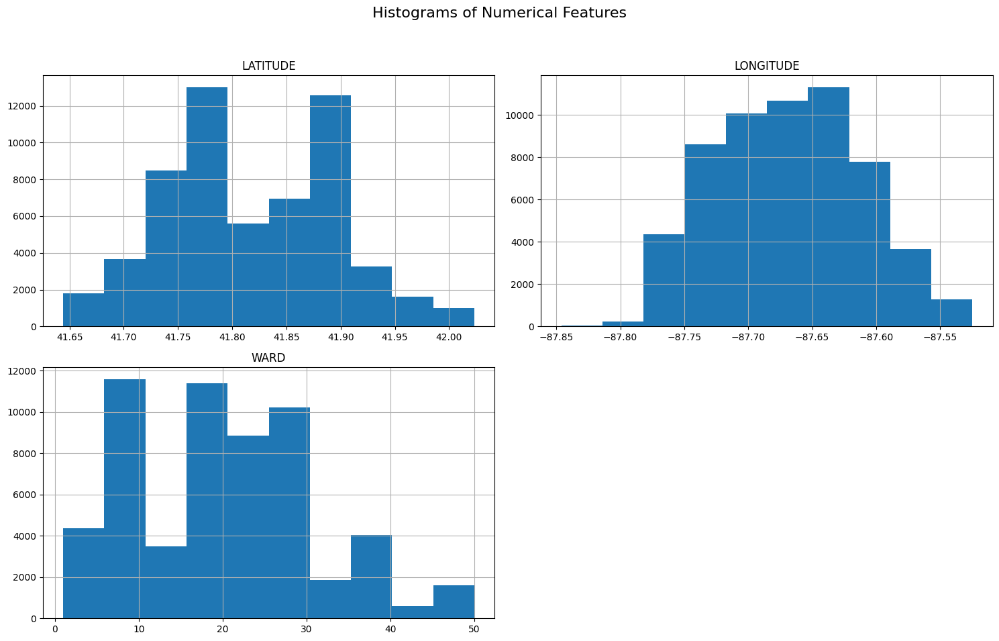

In [14]:
numerical_cols = Violence_Reduction_df.select_dtypes(include=np.number).columns
if not numerical_cols.empty:
    Violence_Reduction_df[numerical_cols].hist(figsize=(15, 10)) 
    plt.suptitle("Histograms of Numerical Features", fontsize=16) 
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) 
    plt.show()
else:
    print("\nNo numerical columns found in the dataset..!!")

#### 1.5.2. Bar plots for Categorical columns :

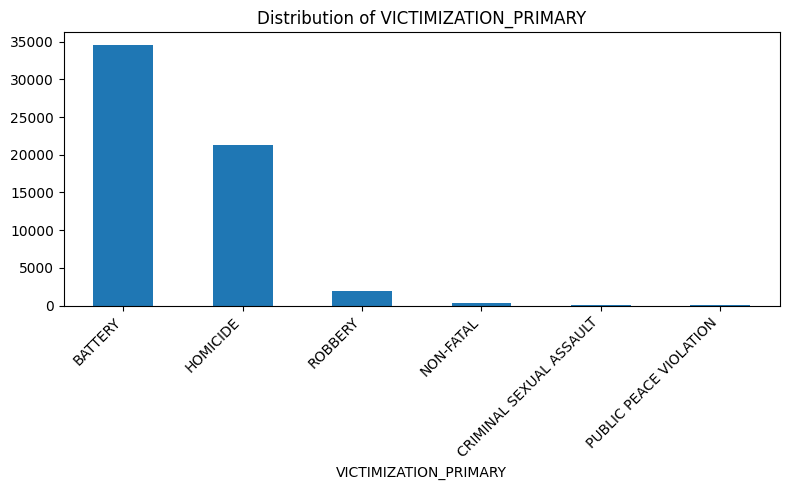

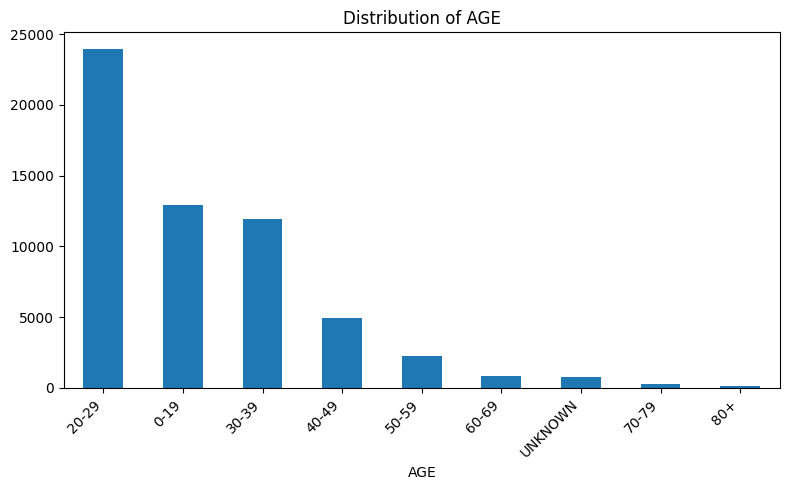

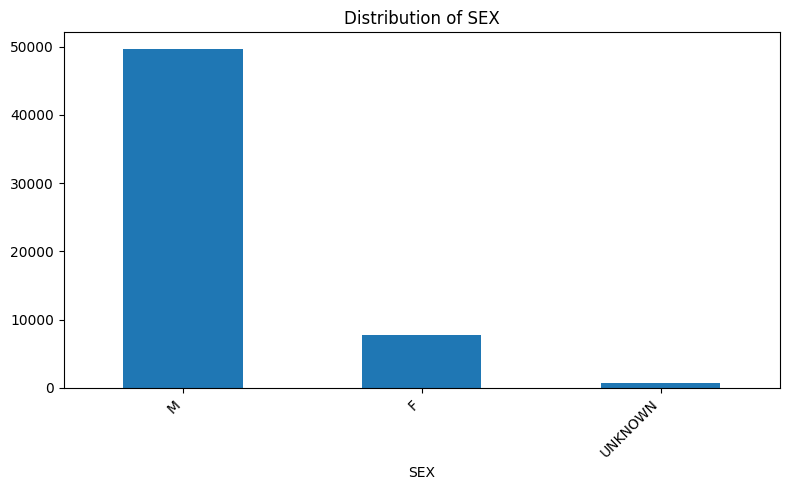

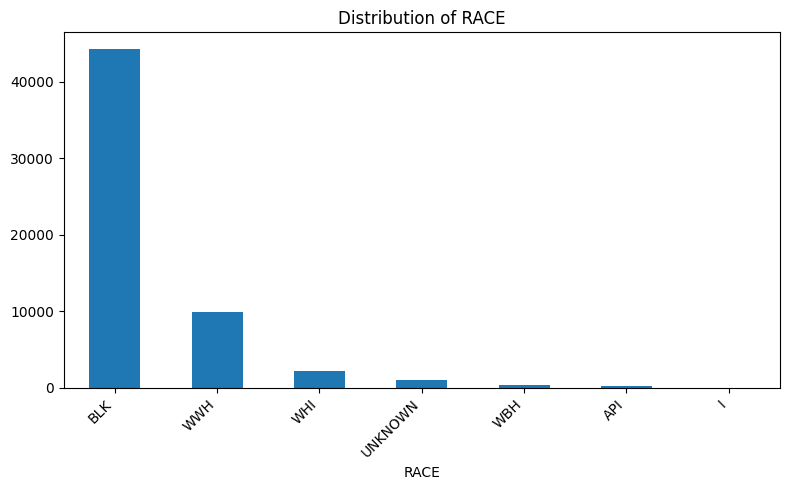

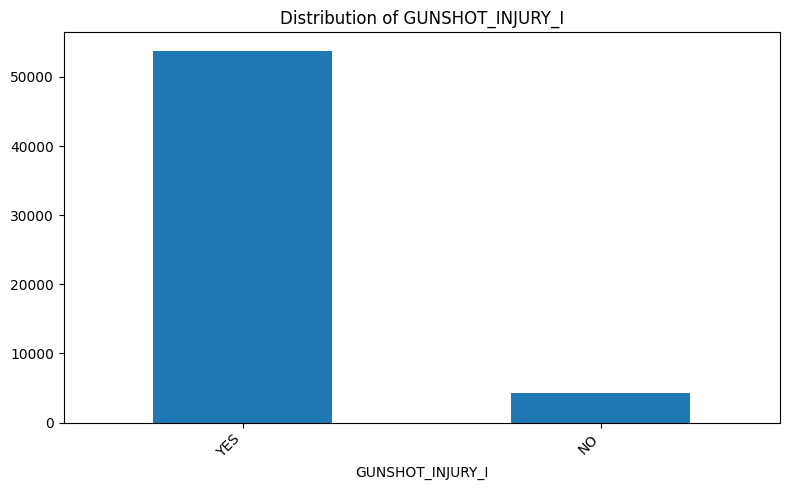

In [15]:
categorical_cols = Violence_Reduction_df[['VICTIMIZATION_PRIMARY','AGE','SEX','RACE','GUNSHOT_INJURY_I']]
if not categorical_cols.empty:
    for col in categorical_cols:
        plt.figure(figsize=(8, 5)) 
        Violence_Reduction_df[col].value_counts().plot(kind='bar')
        plt.title(f'Distribution of {col}')
        plt.xticks(rotation=45, ha='right')  
        plt.tight_layout() 
        plt.show()
else:
    print("\nNo categorical columns found in the dataset..!!")

#### 1.5.3. Check for correlations (Numerical data) :

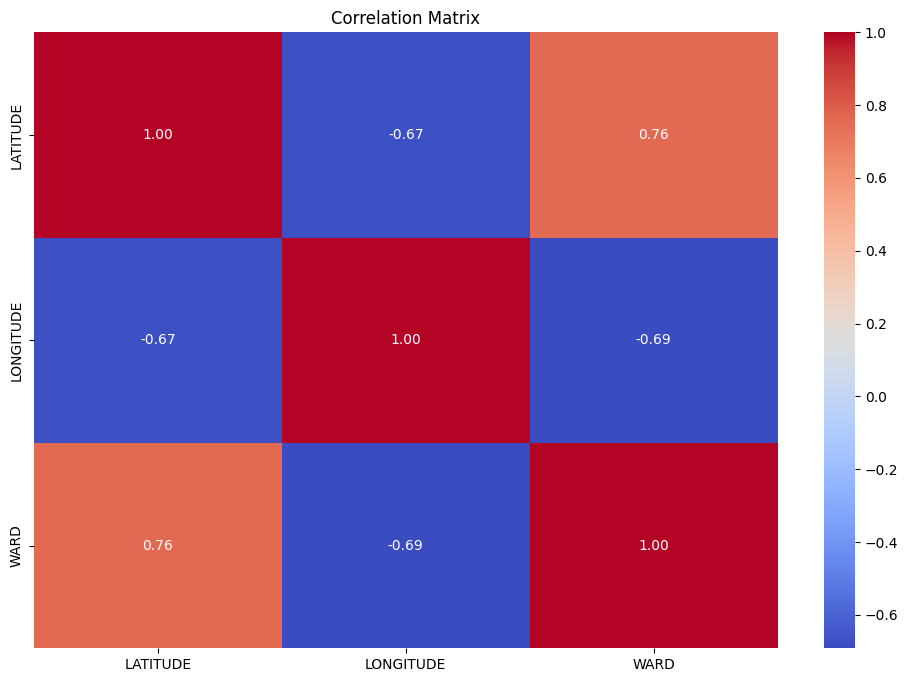

In [16]:
if not numerical_cols.empty:
    correlation_matrix = df[numerical_cols].corr()
    plt.figure(figsize=(12, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f") 
    plt.title("Correlation Matrix")
    plt.show()

## 2. Clean and Preprocess :

### 2.1. Handling Missing Values :

#### 2.1.1. Visualize Missing Data :

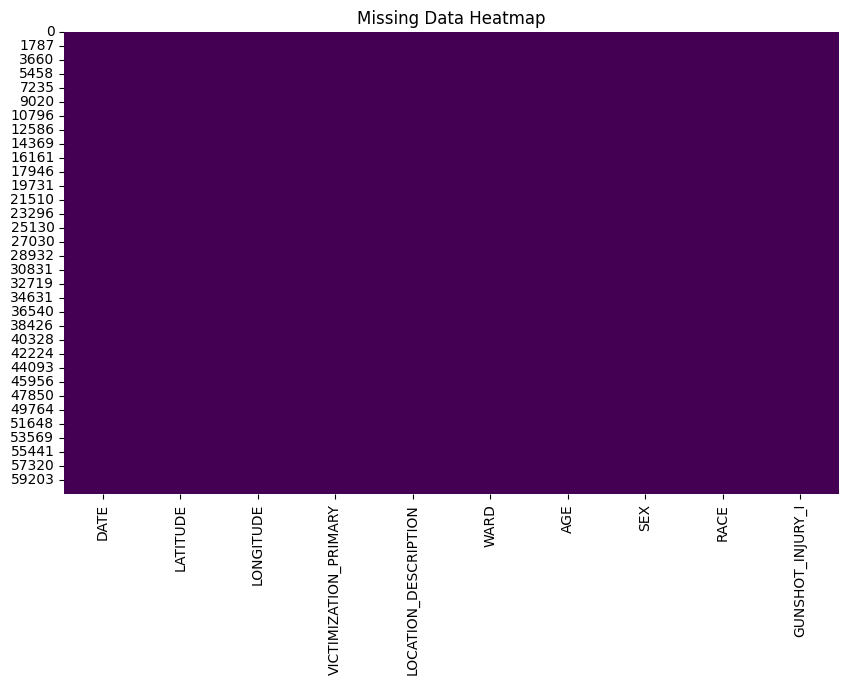

In [17]:
plt.figure(figsize=(10, 6))
sns.heatmap(Violence_Reduction_df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Data Heatmap')
plt.show()

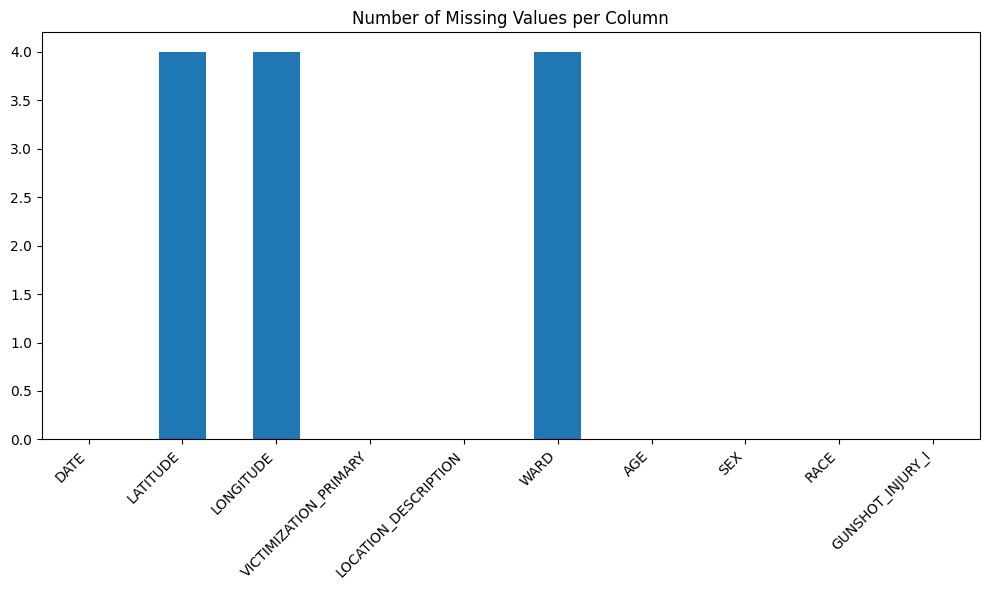

In [18]:
plt.figure(figsize=(10, 6))
Violence_Reduction_df.isnull().sum().plot(kind='bar')
plt.title('Number of Missing Values per Column')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### 2.1.2. Calculate Missing Percentages :

In [19]:
print(f"\nMissing Percentages: {Violence_Reduction_df.isnull().mean() * 100} ")


Missing Percentages: DATE                     0.000000
LATITUDE                 0.006897
LONGITUDE                0.006897
VICTIMIZATION_PRIMARY    0.000000
LOCATION_DESCRIPTION     0.000000
WARD                     0.006897
AGE                      0.000000
SEX                      0.000000
RACE                     0.000000
GUNSHOT_INJURY_I         0.000000
dtype: float64 


#### 2.1.3. Strategies for Handling Missing Data :

##### 2.1.3.1. Dropping Rows :

In [20]:
Violence_Reduction_df.dropna(subset=['LATITUDE', 'LONGITUDE', 'WARD'], inplace=True)

In [21]:
print(f"\nMissing Percentages After Handling: {Violence_Reduction_df.isnull().mean() * 100}")


Missing Percentages After Handling: DATE                     0.0
LATITUDE                 0.0
LONGITUDE                0.0
VICTIMIZATION_PRIMARY    0.0
LOCATION_DESCRIPTION     0.0
WARD                     0.0
AGE                      0.0
SEX                      0.0
RACE                     0.0
GUNSHOT_INJURY_I         0.0
dtype: float64


In [22]:
Violence_Reduction_df.shape

(57989, 10)

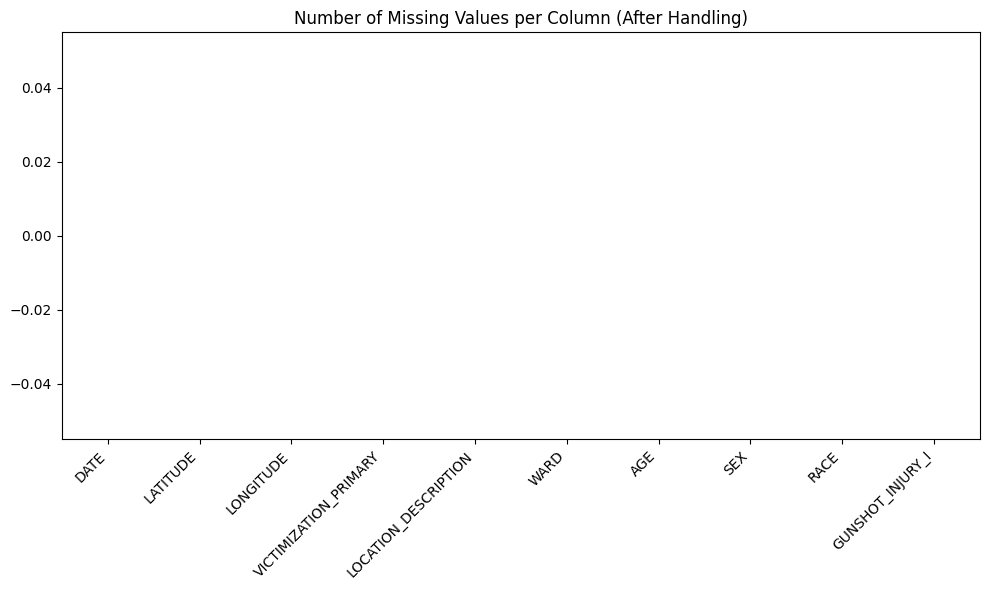

In [23]:
plt.figure(figsize=(10, 6))
Violence_Reduction_df.isnull().sum().plot(kind='bar')
plt.title('Number of Missing Values per Column (After Handling)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### 2.2. Data Type Conversion :

### 2.2.1. Numerical Columns :

#### 2.2.1.1. DATE Column :

In [24]:
Violence_Reduction_df['DATE'] = pd.to_datetime(Violence_Reduction_df['DATE'], errors='coerce')

In [25]:
Violence_Reduction_df['DATE'].dtype

dtype('<M8[ns]')

#### 2.2.1.2. AGE Column ( Convert the 'AGE' ranges to numerical midpoints, 'AGE_MIDPOINT' ) :

In [26]:
def age_range_to_midpoint(age_range):
    if isinstance(age_range, str):  
        try:
            if '+' in age_range: 
                low = int(age_range.replace('+', ''))
                return low 
            else:
                low, high = map(int, age_range.split('-'))
                return (low + high) / 2
        except:  
            return np.nan  
    return age_range 

Violence_Reduction_df['AGE_MIDPOINT'] = Violence_Reduction_df['AGE'].apply(age_range_to_midpoint)

Violence_Reduction_df['AGE_MIDPOINT'].fillna(Violence_Reduction_df['AGE_MIDPOINT'].median(), inplace=True)

Violence_Reduction_df['AGE_MIDPOINT']=Violence_Reduction_df['AGE_MIDPOINT'].astype(int)

Violence_Reduction_df.drop('AGE', axis=1, inplace=True) 

In [27]:
Violence_Reduction_df['AGE_MIDPOINT'].dtype

dtype('int32')

### 2.2.2. Other Columns ( Converting a 'YES/NO' column to integer ) :

#### 2.2.2.1. GUNSHOT_INJURY_I Column :

In [28]:
Violence_Reduction_df['GUNSHOT_INJURY_I'] = Violence_Reduction_df['GUNSHOT_INJURY_I'].replace({'YES': 1, 'NO': 0}).astype('int')

In [29]:
Violence_Reduction_df.rename(columns={'GUNSHOT_INJURY_I': 'GUNSHOT_INJURY'}, inplace=True)

In [30]:
Violence_Reduction_df['GUNSHOT_INJURY'].dtype

dtype('int32')

### 2.2.3. Verify Conversions :

In [31]:
Violence_Reduction_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 57989 entries, 0 to 61078
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   DATE                   57989 non-null  datetime64[ns]
 1   LATITUDE               57989 non-null  float64       
 2   LONGITUDE              57989 non-null  float64       
 3   VICTIMIZATION_PRIMARY  57989 non-null  object        
 4   LOCATION_DESCRIPTION   57989 non-null  object        
 5   WARD                   57989 non-null  float64       
 6   SEX                    57989 non-null  object        
 7   RACE                   57989 non-null  object        
 8   GUNSHOT_INJURY         57989 non-null  int32         
 9   AGE_MIDPOINT           57989 non-null  int32         
dtypes: datetime64[ns](1), float64(3), int32(2), object(4)
memory usage: 4.4+ MB


### 2.3. Cleaning Categorical Data :

### 2.3.1. One-hot encode for Columns VICTIMIZATION_PRIMARY, WARD, SEX and RACE :

In [32]:
Violence_Reduction_df['VICTIMIZATION_PRIMARY'].unique()

array(['HOMICIDE', 'BATTERY', 'ROBBERY', 'NON-FATAL',
       'CRIMINAL SEXUAL ASSAULT', 'PUBLIC PEACE VIOLATION'], dtype=object)

In [33]:
Violence_Reduction_df['WARD'].unique()

array([48.,  6.,  7.,  9., 16., 10., 30., 24., 15.,  8.,  3., 23., 22.,
       29., 12., 36., 21.,  5., 27., 17., 26., 34., 33.,  4., 41., 28.,
       42., 37., 20., 44., 14., 32., 35., 25., 11., 19., 18., 50., 31.,
        1., 13., 46., 49.,  2., 45., 47., 39., 40., 38., 43.])

In [34]:
Violence_Reduction_df['SEX'].unique()

array(['M', 'F', 'UNKNOWN'], dtype=object)

In [35]:
Violence_Reduction_df['RACE'].unique()

array(['BLK', 'API', 'WWH', 'WHI', 'UNKNOWN', 'WBH', 'I'], dtype=object)

In [36]:
columns_to_encode = ['VICTIMIZATION_PRIMARY', 'WARD', 'SEX', 'RACE']

In [37]:
Violence_Reduction_df = pd.get_dummies(Violence_Reduction_df, columns=columns_to_encode, prefix=columns_to_encode,dtype=int,drop_first=True) 

In [38]:
Violence_Reduction_df.head()

,DATE,LATITUDE,LONGITUDE,LOCATION_DESCRIPTION,GUNSHOT_INJURY,AGE_MIDPOINT,VICTIMIZATION_PRIMARY_CRIMINAL SEXUAL ASSAULT,VICTIMIZATION_PRIMARY_HOMICIDE,VICTIMIZATION_PRIMARY_NON-FATAL,VICTIMIZATION_PRIMARY_PUBLIC PEACE VIOLATION,...,WARD_49.0,WARD_50.0,SEX_M,SEX_UNKNOWN,RACE_BLK,RACE_I,RACE_UNKNOWN,RACE_WBH,RACE_WHI,RACE_WWH
0,2022-03-08 15:27:00,41.990570,-87.657000,APARTMENT,0,64,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
1,2023-02-11 02:30:00,41.739900,-87.622860,ALLEY,1,24,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
2,2020-11-21 22:15:00,41.750567,-87.547249,STREET,1,34,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
3,2024-06-23 08:11:00,41.670653,-87.641779,STREET,1,24,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
5,2024-07-04 01:01:00,41.780047,-87.662229,YARD,1,34,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0


### 2.4. Handling Outliers :

#### 2.4.1. Visualize Outliers :

##### 2.4.1.1. Box Plots :

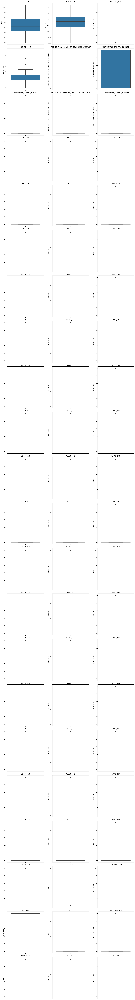

In [39]:
numerical_cols = Violence_Reduction_df.select_dtypes(include=np.number).columns

n_cols = 3
n_rows = (len(numerical_cols) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(numerical_cols):
    if i < len(axes):
        sns.boxplot(y=Violence_Reduction_df[col], ax=axes[i]).set(title=col) 
    else:
        break
plt.tight_layout()
plt.show()

##### 2.4.1.2. Histograms :

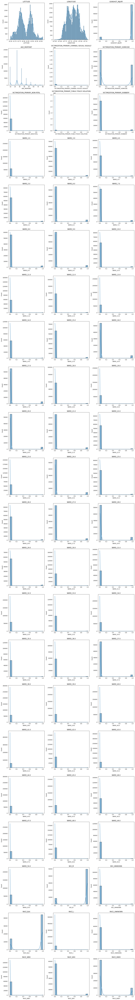

In [40]:
n_cols = 3  
n_rows = (len(numerical_cols) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(numerical_cols):
    if i < len(axes):
        sns.histplot(Violence_Reduction_df[col], kde=True, ax=axes[i]).set(title=col) 
    else:
        break
plt.tight_layout()
plt.show()

#### 2.4.2. Strategies for Handling Outliers :

##### 2.4.2.1. IQR Method (Interquartile Range) :

In [41]:
def remove_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

In [42]:
Violence_Reduction_df = remove_outliers_iqr(Violence_Reduction_df, 'AGE_MIDPOINT')

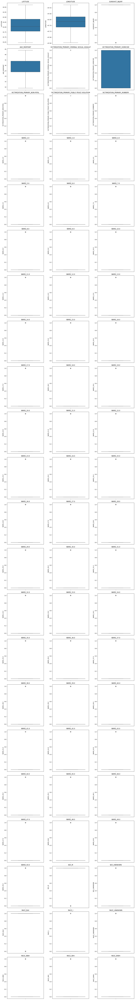

In [43]:
numerical_cols = Violence_Reduction_df.select_dtypes(include=np.number).columns

n_cols = 3
n_rows = (len(numerical_cols) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(numerical_cols):
    if i < len(axes):
        sns.boxplot(y=Violence_Reduction_df[col], ax=axes[i]).set(title=col) 
    else:
        break
plt.tight_layout()
plt.show()

### 2.5 Perform the Feature Engineering :

#### 2.5.1. Create the new columns (YEAR, MONTH, DAY_OF_WEEK, DAY_OF_MONTH, WEEK_OF_YEAR, TIME_OF_DAY, RISK_LEVEL) :

##### 2.6.1.1. YEAR, MONTH, DAY_OF_WEEK, DAY_OF_MONTH, WEEK_OF_YEAR :

In [44]:
if 'DATE' in Violence_Reduction_df.columns:  
    Violence_Reduction_df['YEAR'] = Violence_Reduction_df['DATE'].dt.year
    Violence_Reduction_df['MONTH'] = Violence_Reduction_df['DATE'].dt.month
    Violence_Reduction_df['DAY_OF_WEEK'] = Violence_Reduction_df['DATE'].dt.dayofweek
    Violence_Reduction_df['DAY_OF_MONTH'] = Violence_Reduction_df['DATE'].dt.day
    Violence_Reduction_df['WEEK_OF_YEAR'] = Violence_Reduction_df['DATE'].dt.isocalendar().week 

##### 2.5.1.2. TIME_OF_DAY :

In [45]:
def categorize_time(hour):
    if 6 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 18:
        return 'Afternoon'
    elif 18 <= hour < 22:
        return 'Evening'
    else:
        return 'Night'
Violence_Reduction_df['TIME_OF_DAY'] = Violence_Reduction_df['DATE'].dt.hour.apply(categorize_time)


##### 2.5.1.2.1. One-hot encode TIME_OF_DAY :

In [46]:
Violence_Reduction_df = pd.get_dummies(Violence_Reduction_df, columns=['TIME_OF_DAY'], prefix='TIME_OF_DAY') 

##### 2.5.1.3. RISK_LEVEL (Target Variable - Based on the number of incidents per ward per month) :

In [47]:
ward_columns = Violence_Reduction_df.filter(like='WARD_').columns

##### 2.5.1.3.1. Group by the one-hot encoded WARD columns, MONTH, and YEAR to CREATE INCIDENT_COUNT :

In [48]:
incidents_per_ward_month = Violence_Reduction_df.groupby(list(ward_columns) + ['MONTH', 'YEAR']).size().reset_index(name='INCIDENT_COUNT')

##### 2.5.1.3.2. Define thresholds :

In [49]:
high_risk_threshold = incidents_per_ward_month['INCIDENT_COUNT'].quantile(0.75)  # 75th percentile
medium_risk_threshold = incidents_per_ward_month['INCIDENT_COUNT'].quantile(0.35)  # 35th percentile

##### 2.5.1.3.3. Create the RISK_LEVEL column :

In [50]:
def assign_risk_level(count):
    if count >= high_risk_threshold:
        return 'High'
    elif count >= medium_risk_threshold:
        return 'Medium'
    else:
        return 'Low'

incidents_per_ward_month['RISK_LEVEL'] = incidents_per_ward_month['INCIDENT_COUNT'].apply(assign_risk_level)

##### 2.5.1.3.4. Merge the risk level back into the main DataFrame (using the one-hot encoded WARD columns) :

In [51]:
Violence_Reduction_df = pd.merge(Violence_Reduction_df, incidents_per_ward_month[list(ward_columns) + ['MONTH', 'YEAR', 'RISK_LEVEL', 'INCIDENT_COUNT']], 
              on=list(ward_columns) + ['MONTH', 'YEAR'], how='left')

In [52]:
Violence_Reduction_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54484 entries, 0 to 54483
Data columns (total 79 columns):
 #   Column                                         Non-Null Count  Dtype         
---  ------                                         --------------  -----         
 0   DATE                                           54484 non-null  datetime64[ns]
 1   LATITUDE                                       54484 non-null  float64       
 2   LONGITUDE                                      54484 non-null  float64       
 3   LOCATION_DESCRIPTION                           54484 non-null  object        
 4   GUNSHOT_INJURY                                 54484 non-null  int32         
 5   AGE_MIDPOINT                                   54484 non-null  int32         
 6   VICTIMIZATION_PRIMARY_CRIMINAL SEXUAL ASSAULT  54484 non-null  int32         
 7   VICTIMIZATION_PRIMARY_HOMICIDE                 54484 non-null  int32         
 8   VICTIMIZATION_PRIMARY_NON-FATAL                54484 non

##### 2.5.1.3.5. One-hot encode RISK_LEVEL :

In [53]:
Violence_Reduction_df = pd.get_dummies(Violence_Reduction_df, columns=['RISK_LEVEL'], prefix='RISK_LEVEL')

##### 2.5.1.3.6. Convert Original RISK_LEVEL to Numeric :

In [54]:
Violence_Reduction_df['RISK_LEVEL_Numeric'] = Violence_Reduction_df[['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low']].idxmax(axis=1).astype('category').cat.codes

In [55]:
Violence_Reduction_df['RISK_LEVEL_Numeric'] = Violence_Reduction_df['RISK_LEVEL_Numeric'].astype('int')

In [56]:
print(Violence_Reduction_df)

                     DATE   LATITUDE  LONGITUDE LOCATION_DESCRIPTION  \
0     2023-02-11 02:30:00  41.739900 -87.622860                ALLEY   
1     2020-11-21 22:15:00  41.750567 -87.547249               STREET   
2     2024-06-23 08:11:00  41.670653 -87.641779               STREET   
3     2024-07-04 01:01:00  41.780047 -87.662229                 YARD   
4     2024-04-28 22:54:00  41.733280 -87.545900               STREET   
...                   ...        ...        ...                  ...   
54479 2025-01-01 03:00:00  41.878187 -87.732239            APARTMENT   
54480 2025-01-28 09:11:00  41.916885 -87.795672               STREET   
54481 2024-01-12 21:45:00  41.766742 -87.670865               STREET   
54482 2025-01-28 04:50:00  41.753998 -87.568065                ALLEY   
54483 2025-01-27 05:16:00  41.793892 -87.669765               STREET   

       GUNSHOT_INJURY  AGE_MIDPOINT  \
0                   1            24   
1                   1            34   
2                 

### 2.6. Visualization :

#### 2.6.1. Distribution of Target Variable :

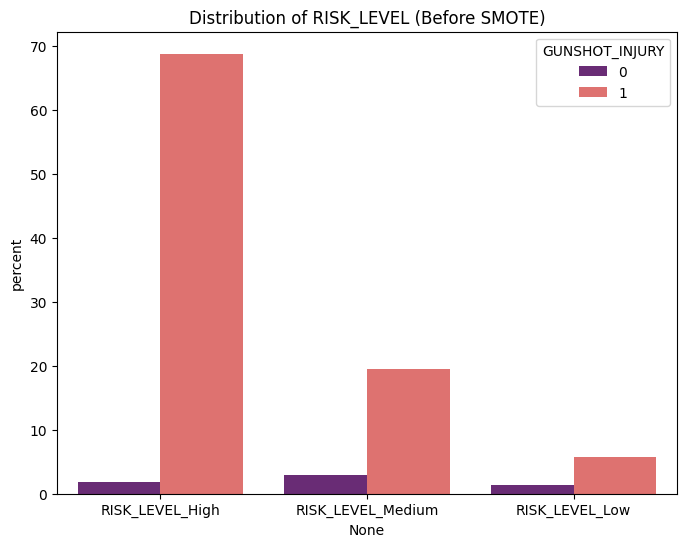

In [57]:
plt.figure(figsize=(8, 6))
sns.countplot(x=Violence_Reduction_df[['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low']].idxmax(axis=1),palette='magma',hue=Violence_Reduction_df['GUNSHOT_INJURY'], stat="percent") 
plt.title('Distribution of RISK_LEVEL (Before SMOTE)')
plt.show()

#### 2.6.2. Feature Distributions :

##### 2.6.2.1. Numerical features :

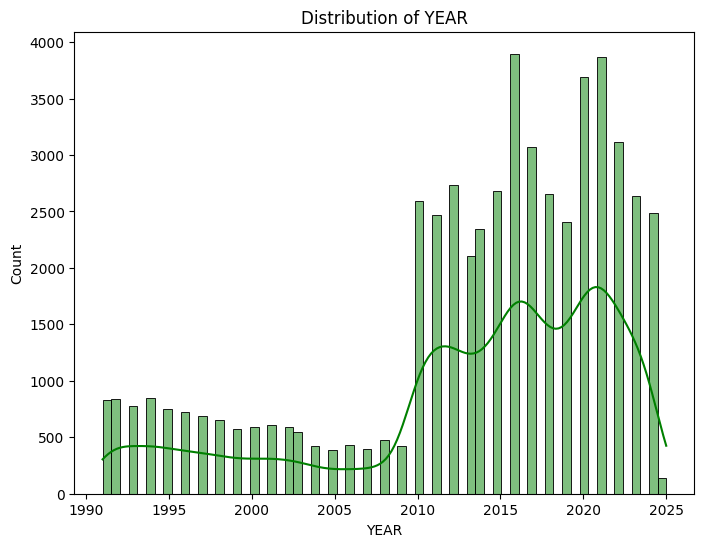

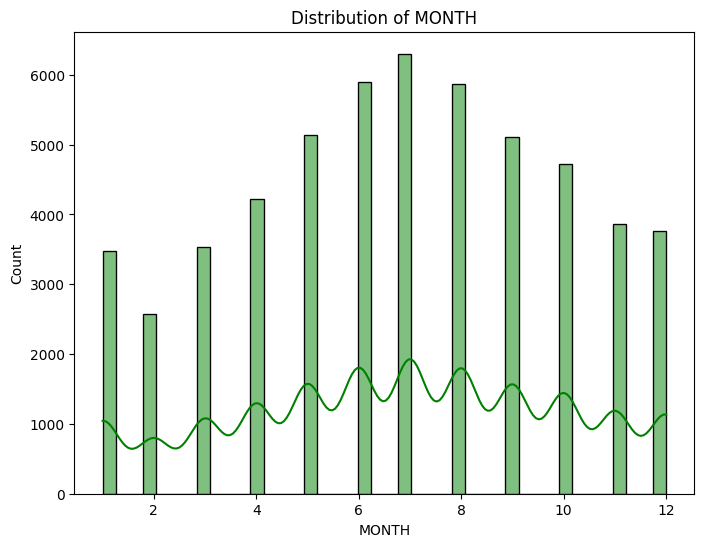

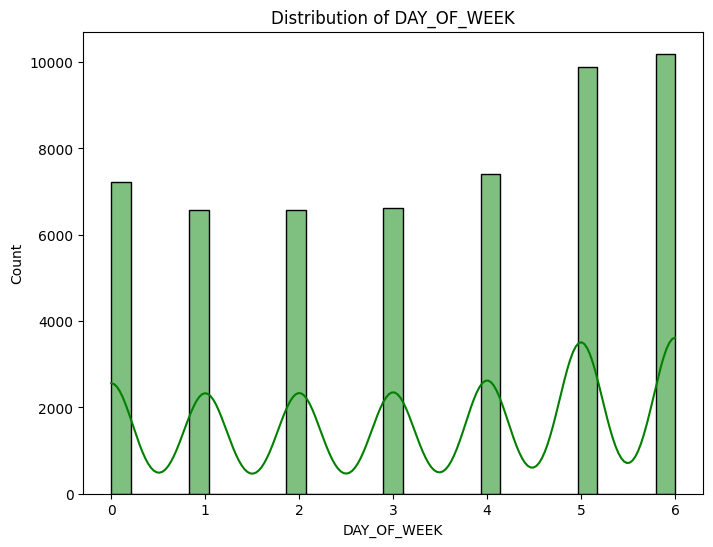

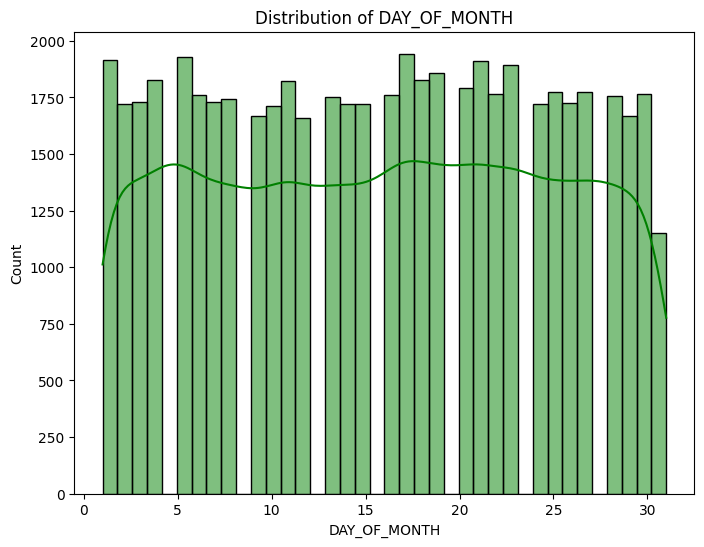

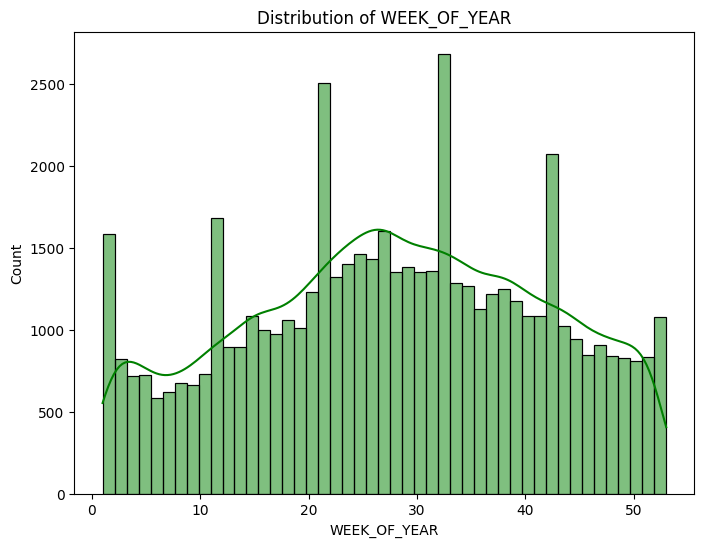

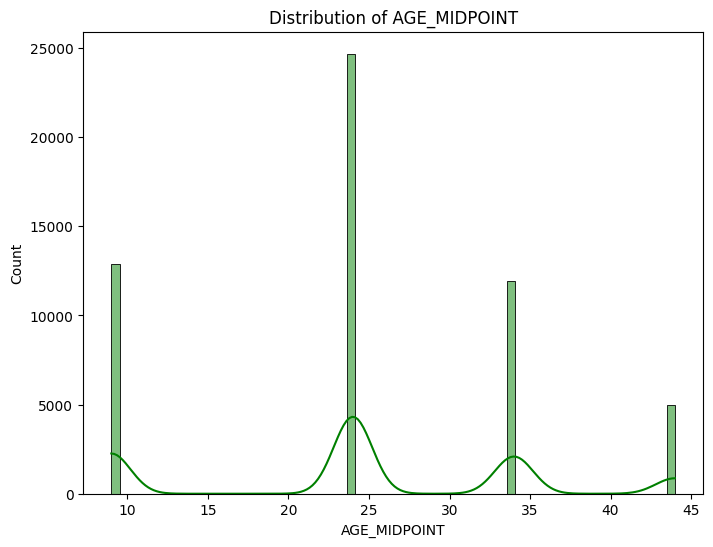

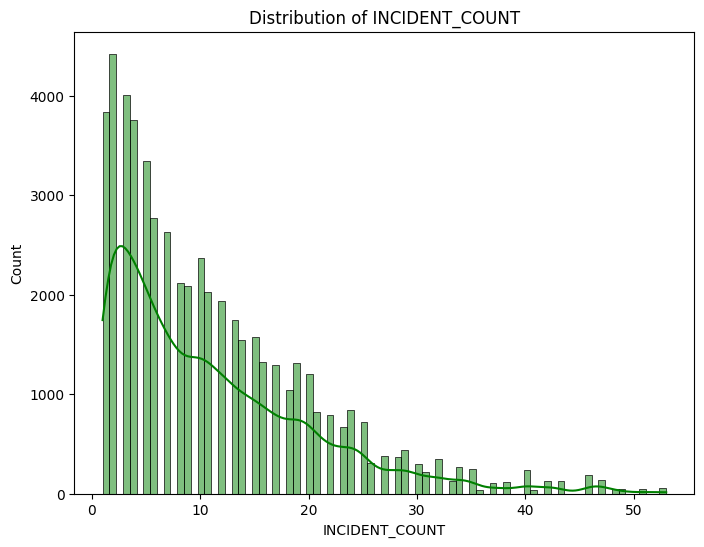

In [58]:
numerical_features = ['YEAR', 'MONTH', 'DAY_OF_WEEK', 'DAY_OF_MONTH', 'WEEK_OF_YEAR', 'AGE_MIDPOINT', 'INCIDENT_COUNT']
for feature in numerical_features:
    if feature in Violence_Reduction_df.columns: 
        plt.figure(figsize=(8, 6))
        sns.histplot(Violence_Reduction_df[feature],color='g', kde=True)  
        plt.title(f'Distribution of {feature}')
        plt.show()

##### 2.6.2.2. Categorical features (one-hot encoded WARDs) :

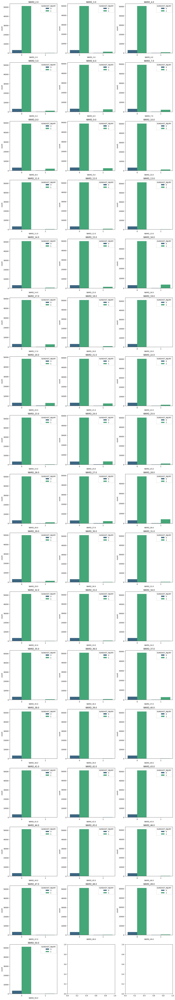

In [59]:
ward_columns = [col for col in Violence_Reduction_df.columns if col.startswith('WARD_')]
n_cols = 3  
n_rows = (len(ward_columns) + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()

for i, col in enumerate(ward_columns):
    if i < len(axes):
        sns.color_palette("husl", 9)
        sns.countplot(x=Violence_Reduction_df[col],hue =Violence_Reduction_df['GUNSHOT_INJURY'], palette='viridis', ax=axes[i]).set(title=col)
    else:
        break
plt.tight_layout()
plt.show()


#### 2.6.2.3. Time of Day (if one-hot encoded) :

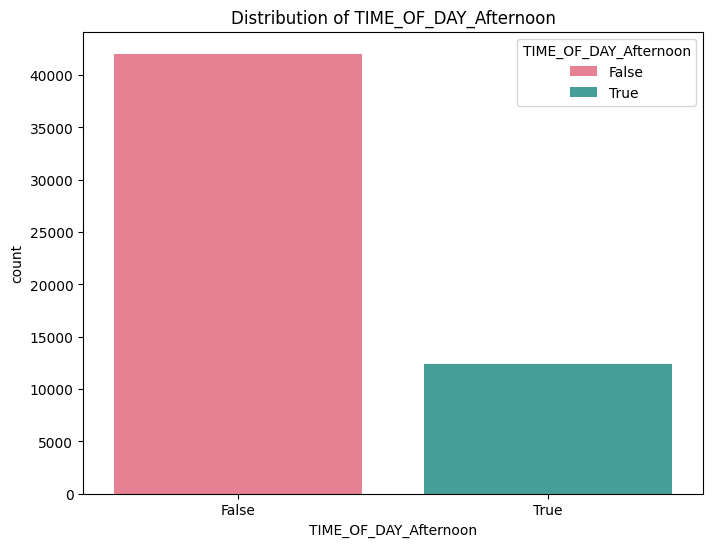

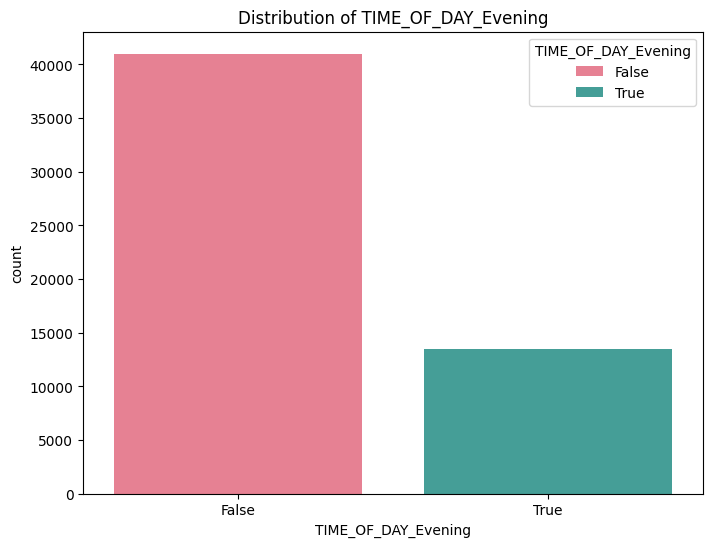

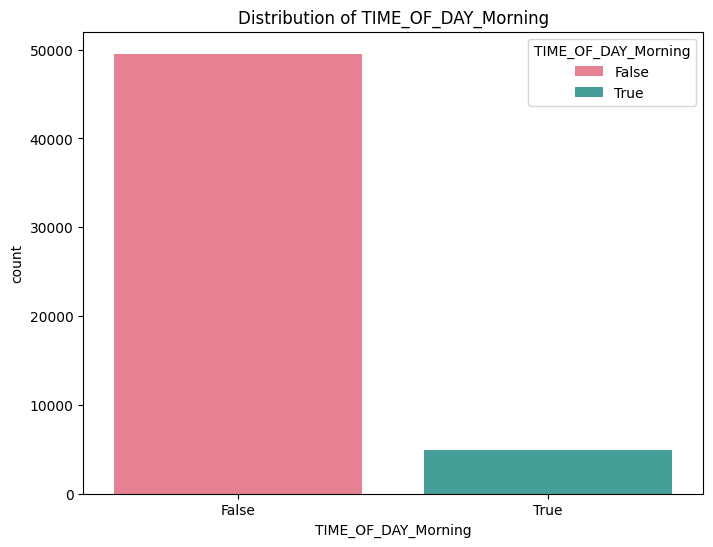

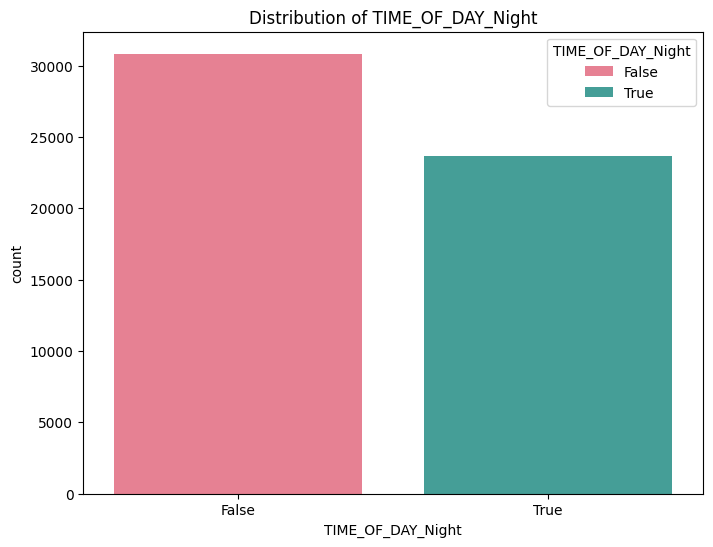

In [60]:
time_of_day_columns = [col for col in Violence_Reduction_df.columns if col.startswith('TIME_OF_DAY_')]
for tod in time_of_day_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=Violence_Reduction_df[tod], palette='husl',hue=Violence_Reduction_df[tod])
    plt.title(f'Distribution of {tod}')
    plt.show()

#### 2.6.3. Relationship between Features and Target :

##### 2.6.3.1. Box plots for numerical features vs. RISK_LEVEL :

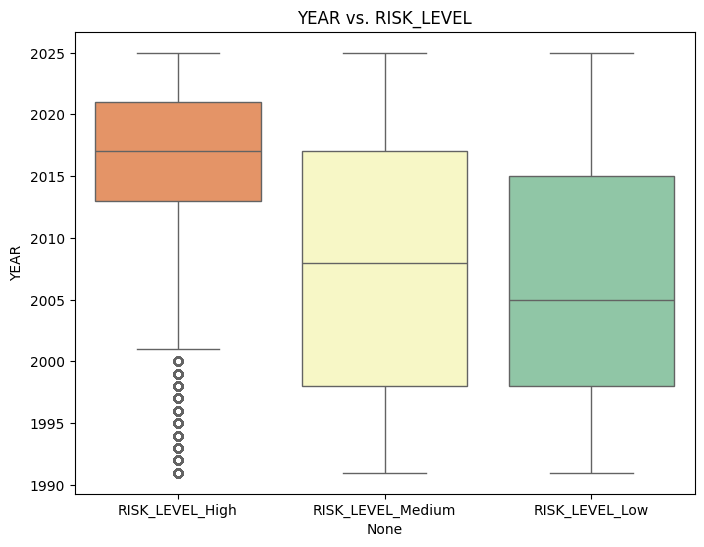

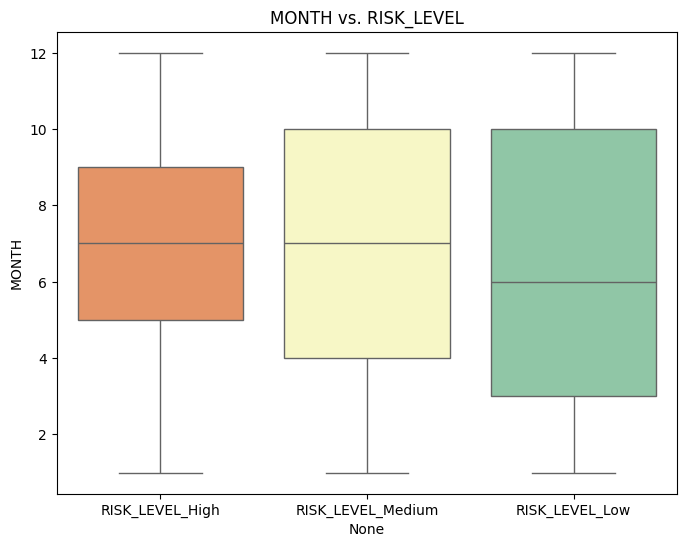

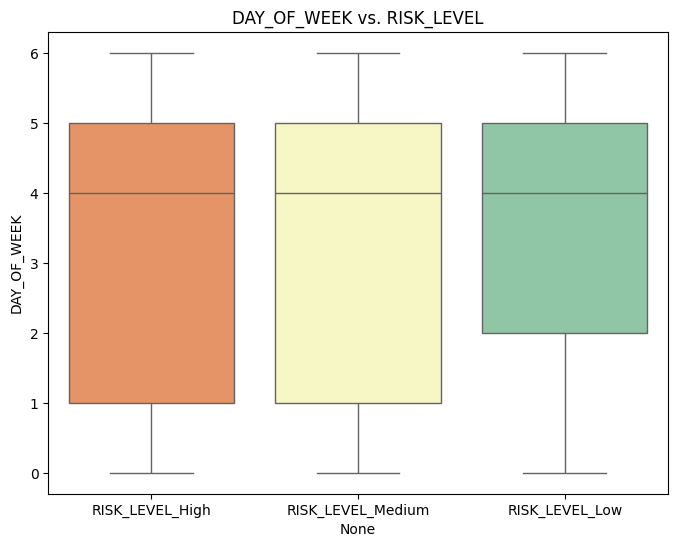

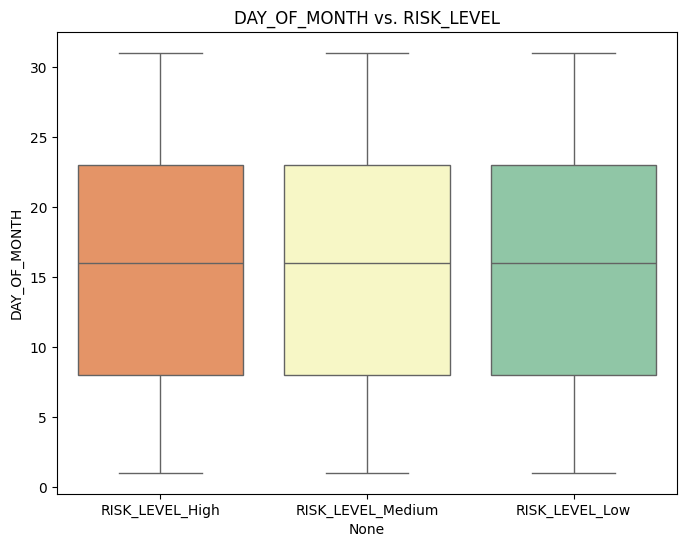

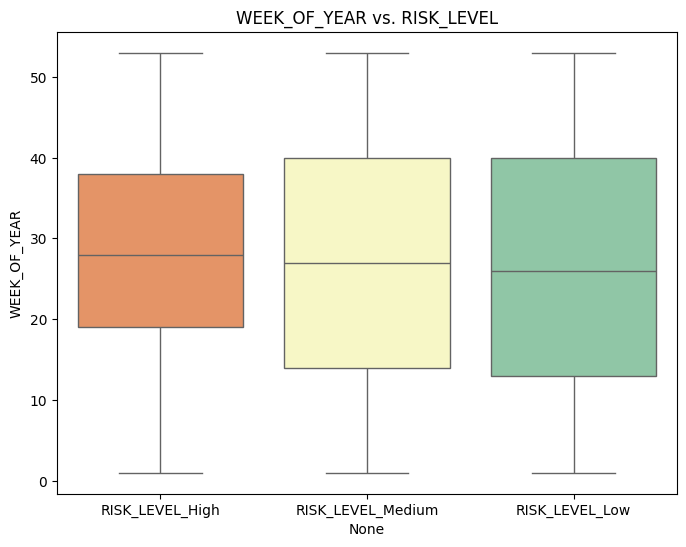

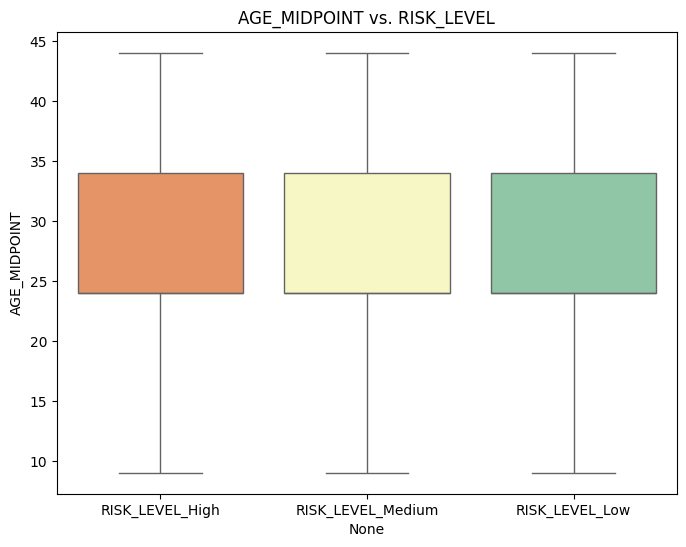

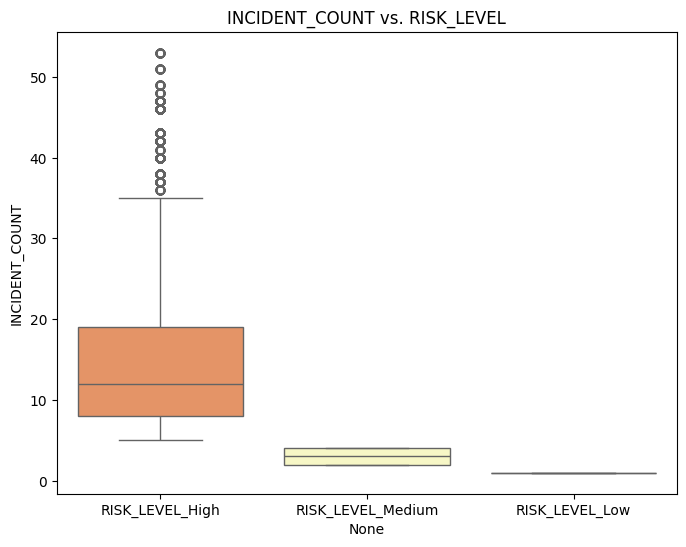

In [61]:
for feature in numerical_features:
    if feature in Violence_Reduction_df.columns: # Check if the column exists to avoid errors.
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=Violence_Reduction_df[['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low']].idxmax(axis=1), y=Violence_Reduction_df[feature], palette='Spectral') 
        plt.title(f'{feature} vs. RISK_LEVEL')
        plt.show()

#### 2.6.4. Scatter Plots of Month vs. Incident Count :

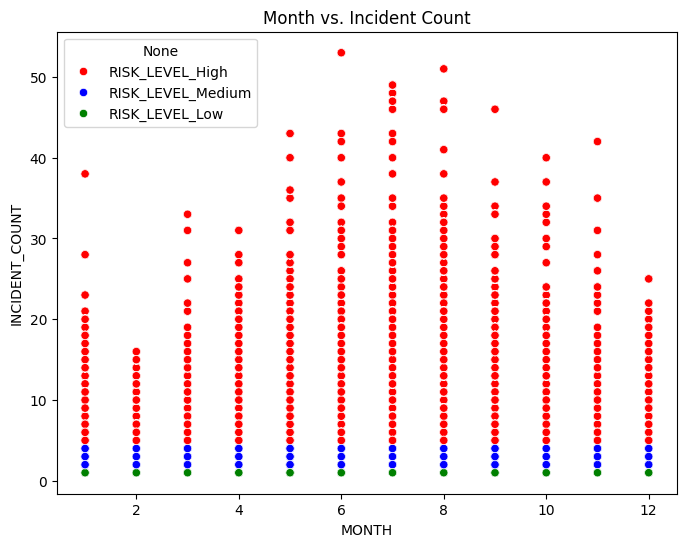

In [62]:
colors = ['red','blue', 'green']
plt.figure(figsize=(8, 6))
sns.scatterplot(x='MONTH', y='INCIDENT_COUNT', hue=Violence_Reduction_df[['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low']].idxmax(axis=1), data=Violence_Reduction_df, palette=colors)
plt.title('Month vs. Incident Count')
plt.show()

#### 2.6.5.  Pair Plot :

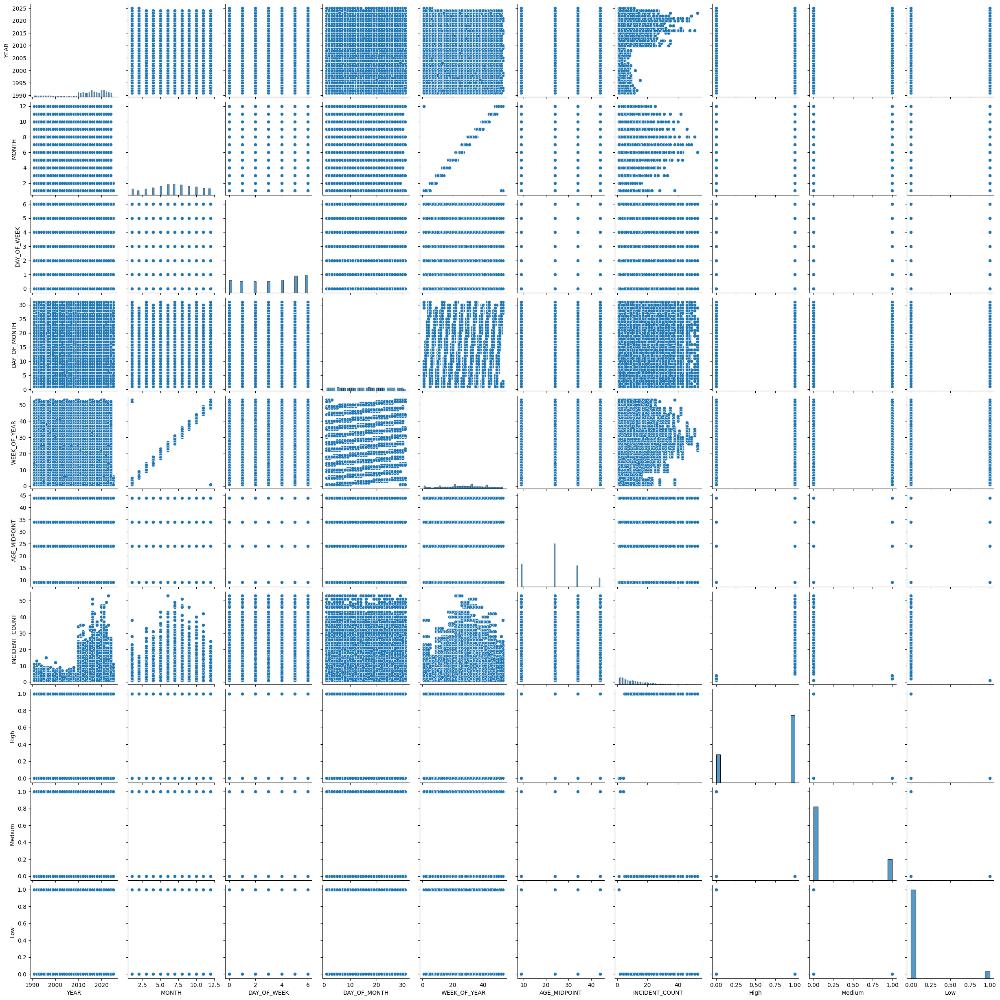

In [63]:
numerical_features = ['YEAR', 'MONTH', 'DAY_OF_WEEK', 'DAY_OF_MONTH', 'WEEK_OF_YEAR', 'AGE_MIDPOINT', 'INCIDENT_COUNT']
sns.pairplot(Violence_Reduction_df[numerical_features + ['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low']].rename(columns=lambda x: x.replace('RISK_LEVEL_', '')),palette='magma') 
plt.show()

#### 2.6.6. Pie Chart (Distribution of Risk Levels) :

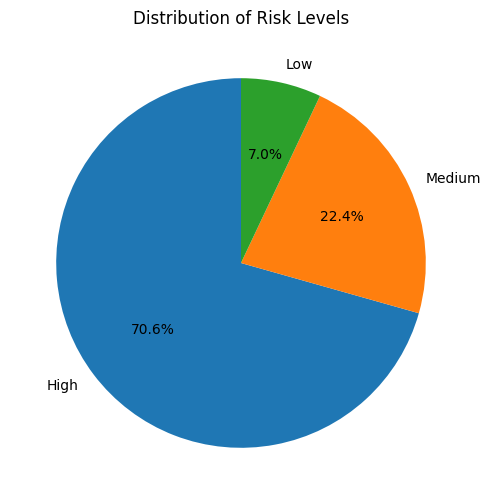

In [64]:
risk_level_counts = Violence_Reduction_df[['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low']].sum().values 

labels = ['High', 'Medium', 'Low']  
plt.figure(figsize=(8, 6))
plt.pie(risk_level_counts, labels=labels, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Risk Levels')
plt.show()

#### 2.6.7. Joint Plots :

##### 2.6.7.1. Joint Plot of Incident Count vs. Age :

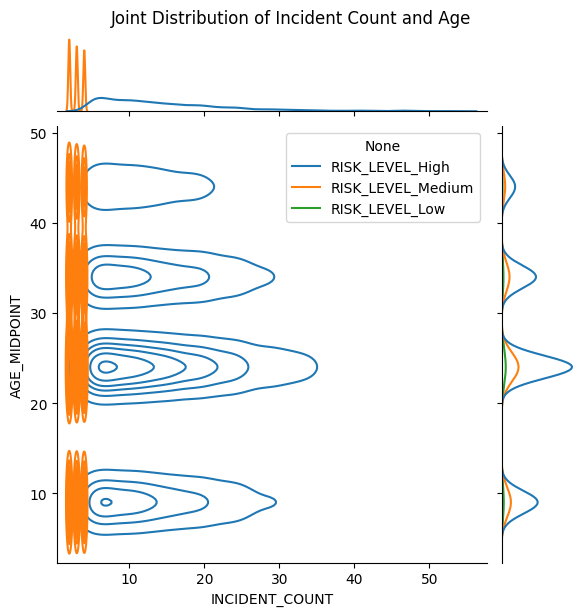

In [65]:
sns.jointplot(x='INCIDENT_COUNT', y='AGE_MIDPOINT', data=Violence_Reduction_df, kind='kde', hue=Violence_Reduction_df[['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low']].idxmax(axis=1)) # KDE plot with risk level as hue
plt.suptitle('Joint Distribution of Incident Count and Age', y=1.02)
plt.show();

##### 2.6.7.2. Joint Plot of Month and Incident Count :

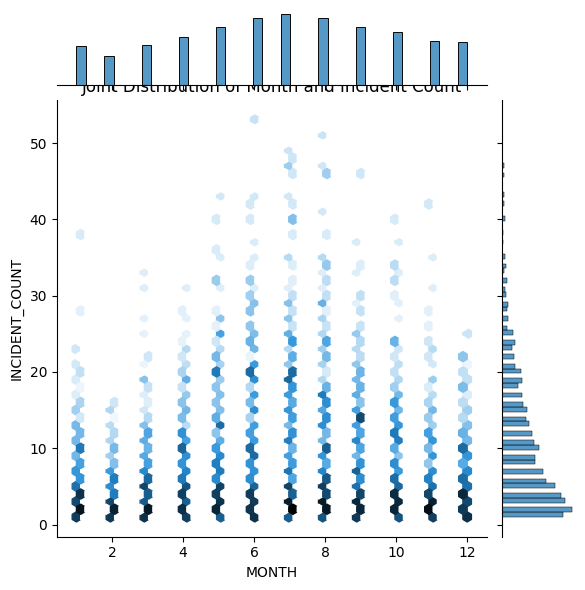

In [66]:
sns.jointplot(x='MONTH', y='INCIDENT_COUNT', data=Violence_Reduction_df, kind='hex',palette="viridis")
plt.title('Joint Distribution of Month and Incident Count')
plt.show()

#### 2.6.8. Violin Plots :

#### 2.6.8.1. Violin Plot for Age Midpoint vs. Risk Level :

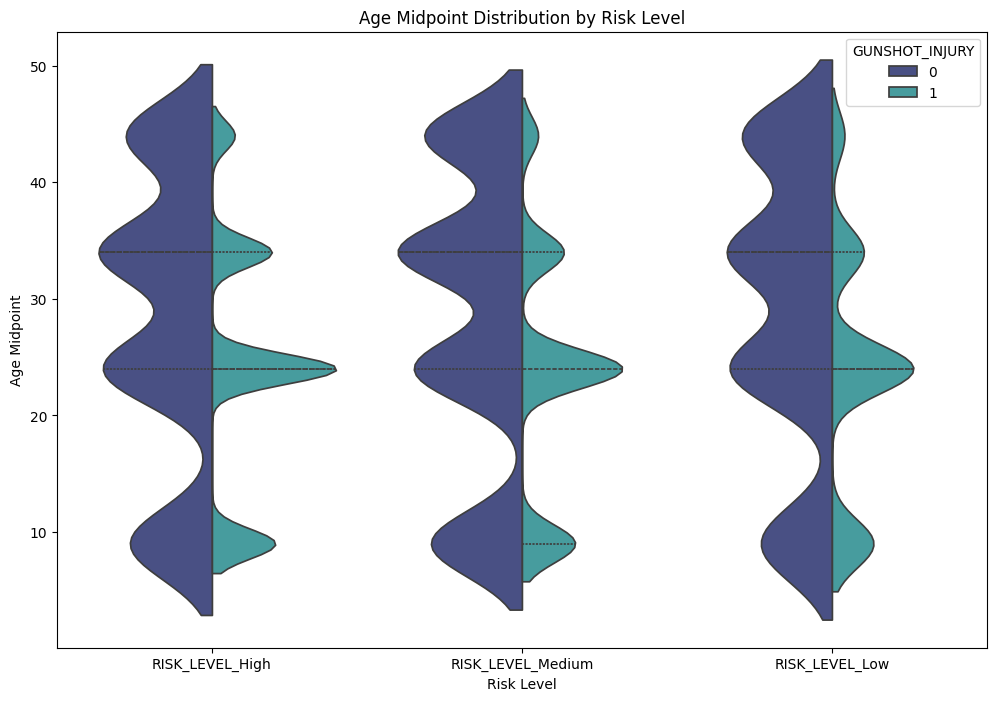

In [67]:
plt.figure(figsize=(12, 8))
sns.violinplot(x=Violence_Reduction_df[['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low']].idxmax(axis=1), y=Violence_Reduction_df['AGE_MIDPOINT'], split=True,hue =Violence_Reduction_df['GUNSHOT_INJURY'], palette='mako', inner="quart")
plt.title('Age Midpoint Distribution by Risk Level')
plt.xlabel('Risk Level')
plt.ylabel('Age Midpoint')
plt.show()

#### 2.6.8.2. Violin Plot for RACE vs. Numerical Features :

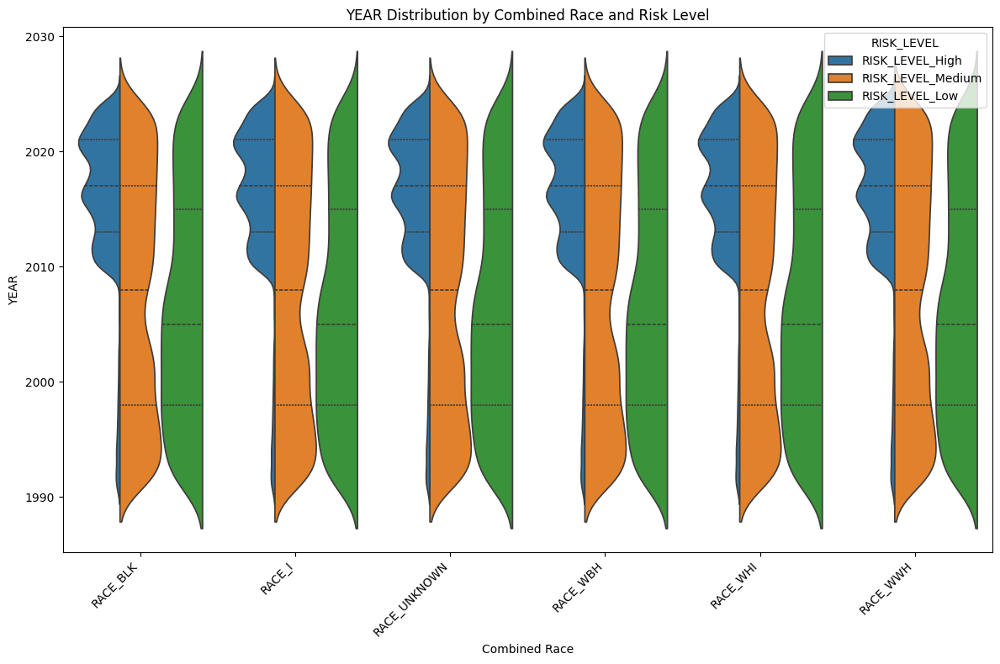

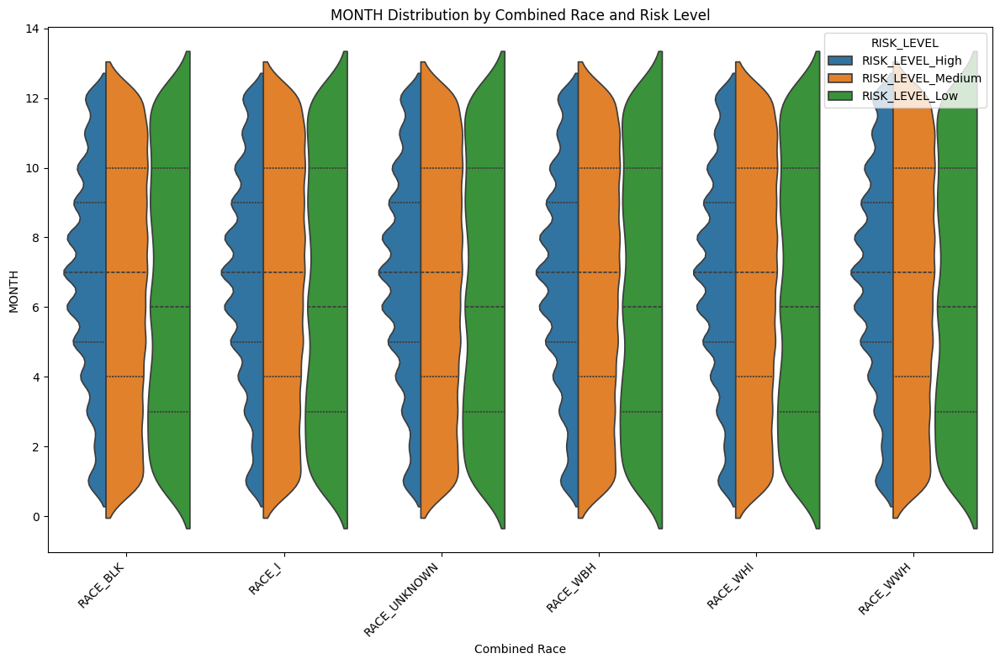

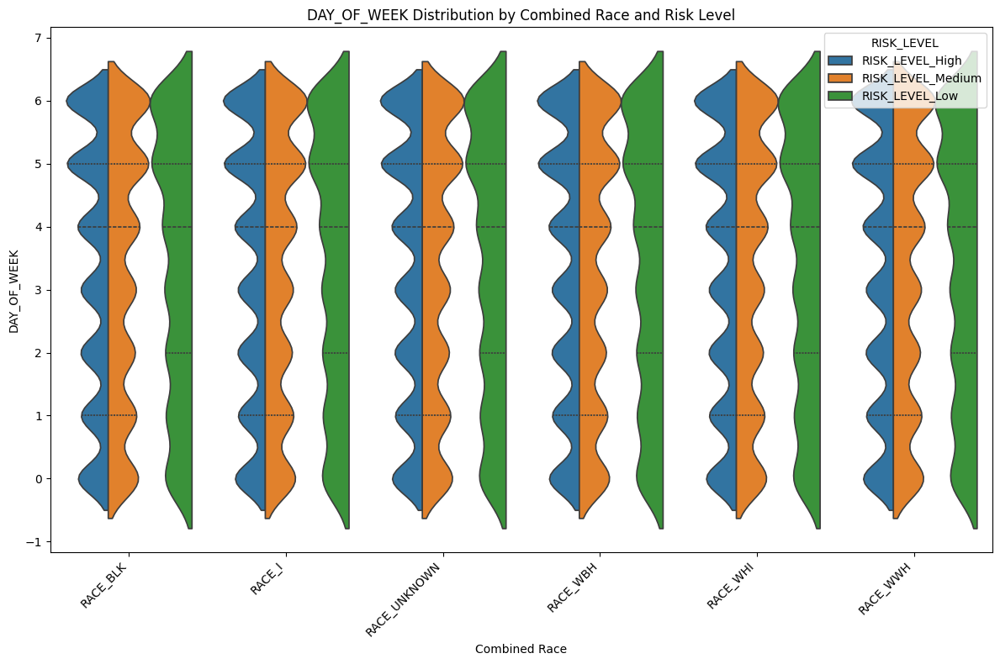

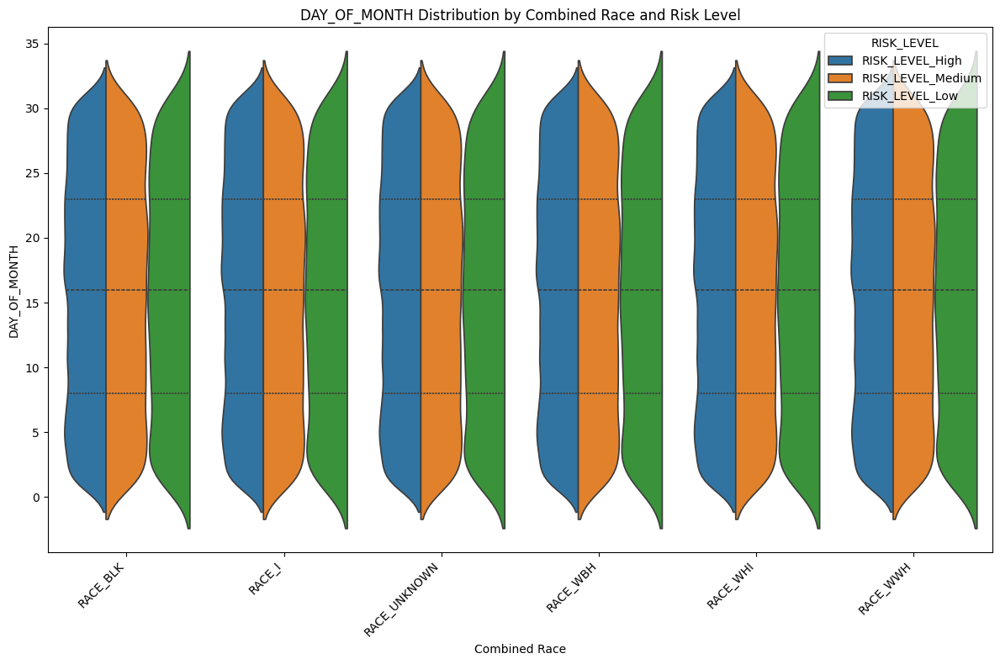

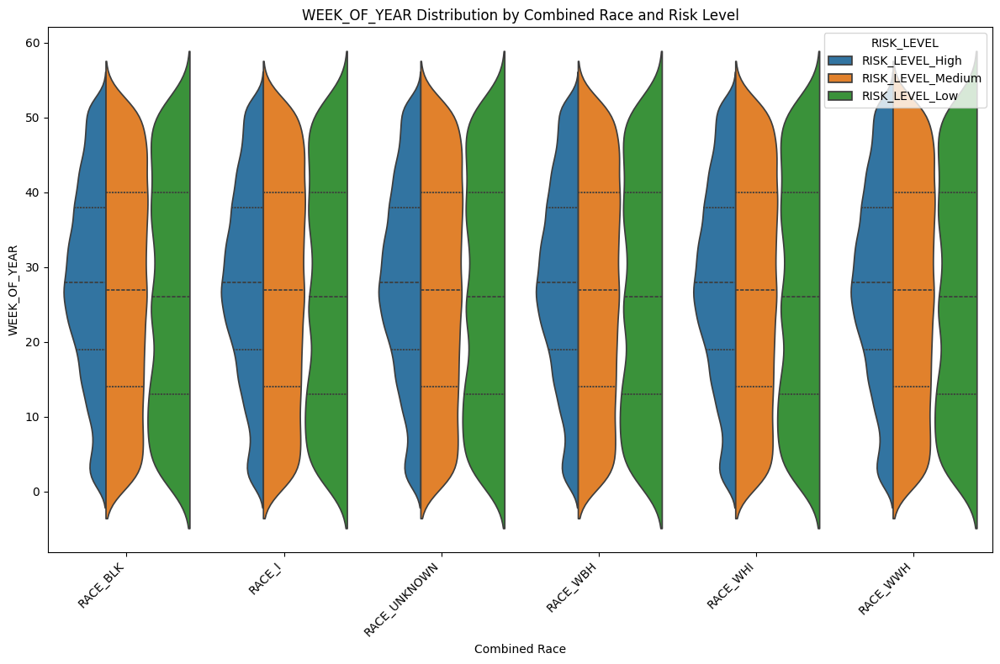

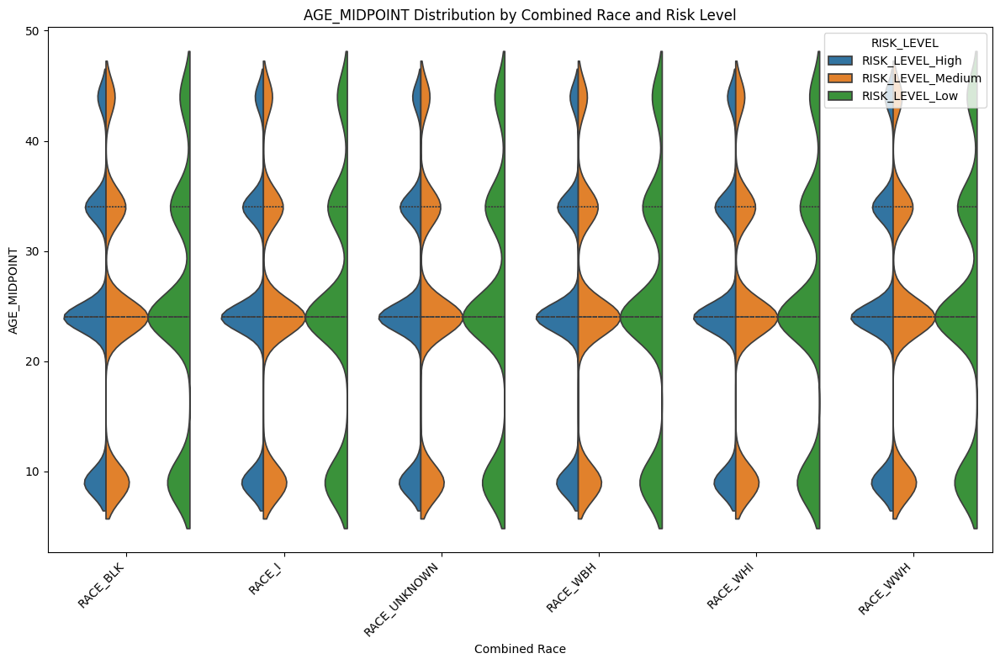

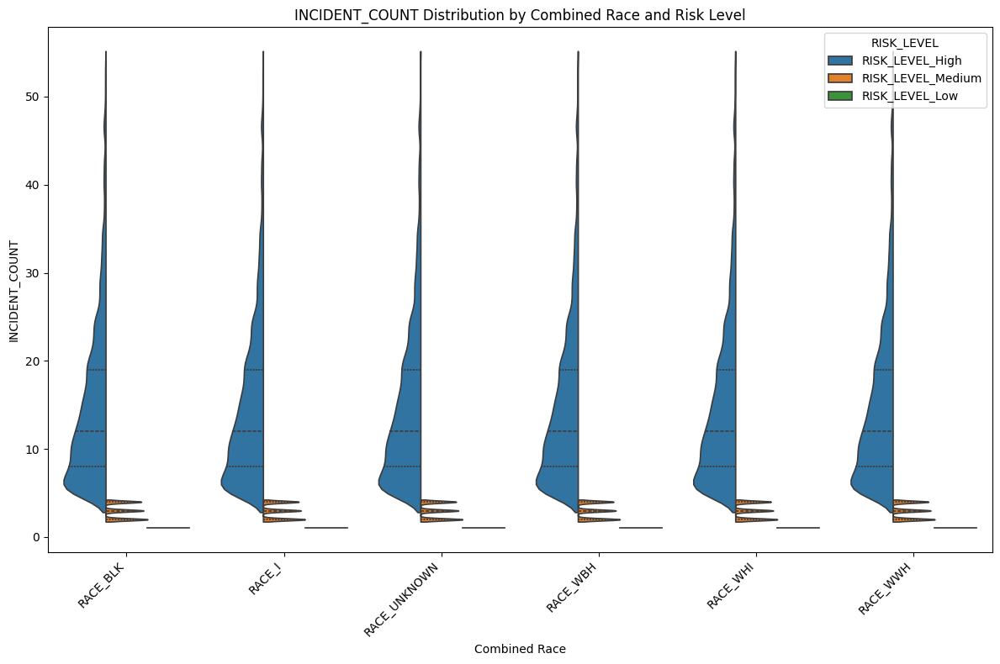

In [68]:
race_columns = [
    'RACE_BLK',
    'RACE_I',
    'RACE_UNKNOWN',
    'RACE_WBH',
    'RACE_WHI',
    'RACE_WWH'
]

numerical_features = ['YEAR', 'MONTH', 'DAY_OF_WEEK', 'DAY_OF_MONTH', 'WEEK_OF_YEAR', 'AGE_MIDPOINT', 'INCIDENT_COUNT']  

if all(col in Violence_Reduction_df.columns for col in race_columns):

    df_melted = pd.melt(Violence_Reduction_df, id_vars=['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low'] + numerical_features, value_vars=race_columns, var_name='RACE', value_name='Count')  

    df_melted['RISK_LEVEL'] = df_melted[['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low']].idxmax(axis=1)

    for num_feature in numerical_features: 
        if num_feature in df_melted.columns:  
            plt.figure(figsize=(12, 8))
            sns.violinplot(x='RACE', y=num_feature, hue='RISK_LEVEL', data=df_melted, split=True, inner="quart")  
            plt.title(f'{num_feature} Distribution by Combined Race and Risk Level')
            plt.xlabel('Combined Race')
            plt.ylabel(num_feature)
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            plt.show()
else:
    print("Not all required race columns found in DataFrame.")

#### 2.6.9. Line Graph for VICTIMIZATION_PRIMARY Types :

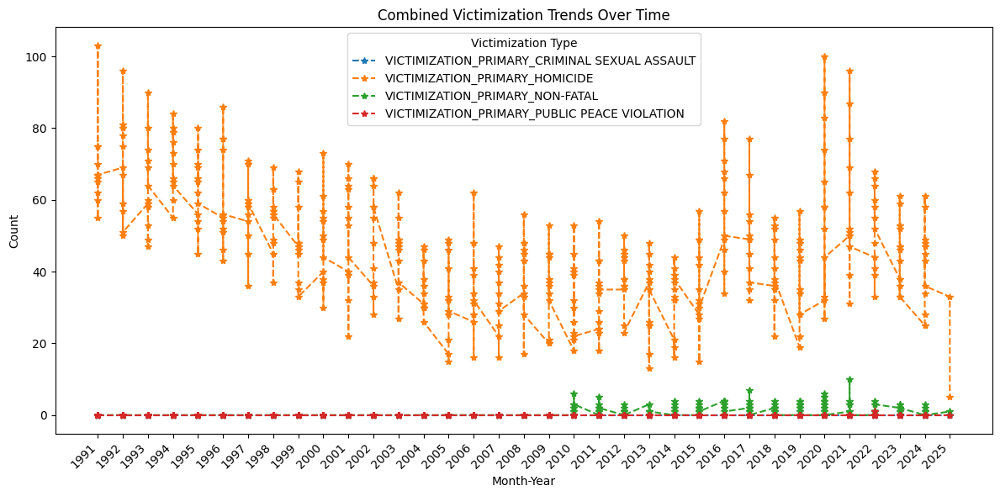

In [69]:
victimization_columns = [
    'VICTIMIZATION_PRIMARY_CRIMINAL SEXUAL ASSAULT',
    'VICTIMIZATION_PRIMARY_HOMICIDE',
    'VICTIMIZATION_PRIMARY_NON-FATAL',
    'VICTIMIZATION_PRIMARY_PUBLIC PEACE VIOLATION'
]

if all(col in Violence_Reduction_df.columns for col in victimization_columns):

    df_melted = pd.melt(Violence_Reduction_df, id_vars=['YEAR','MONTH'], value_vars=victimization_columns, var_name='VICTIMIZATION_PRIMARY', value_name='Count')

    combined_counts = df_melted.groupby(['YEAR', 'MONTH', 'VICTIMIZATION_PRIMARY'])['Count'].sum().reset_index()

    plt.figure(figsize=(12, 6))  

    for victimization_type in combined_counts['VICTIMIZATION_PRIMARY'].unique(): 
        data = combined_counts[combined_counts['VICTIMIZATION_PRIMARY'] == victimization_type].sort_values(['YEAR', 'MONTH'])
        plt.plot(data['YEAR'].astype(str), data['Count'],marker='*',linestyle='--', label=victimization_type) 
    plt.title('Combined Victimization Trends Over Time')
    plt.xlabel('Month-Year')
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.legend(title='Victimization Type')
    plt.tight_layout()
    plt.show()

else:
    print("Not all required victimization columns found in DataFrame.")

#### 2.6.10. Stacked Bar Chart for LOCATION_GROUP :

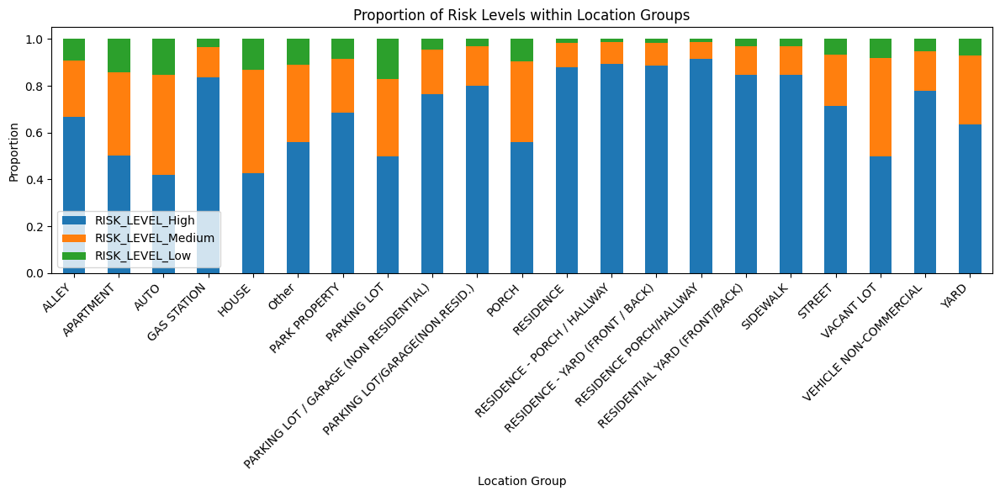

In [70]:
# Get the top N most frequent locations
top_n = 20  # Adjust as needed
top_locations = Violence_Reduction_df['LOCATION_DESCRIPTION'].value_counts().nlargest(top_n).index

# Create a 'LOCATION_GROUP' column.
Violence_Reduction_df['LOCATION_GROUP'] = Violence_Reduction_df['LOCATION_DESCRIPTION'].apply(lambda loc: loc if loc in top_locations else 'Other')

location_risk_counts = Violence_Reduction_df.groupby('LOCATION_GROUP')[['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low']].sum()
location_risk_proportions = location_risk_counts.div(location_risk_counts.sum(axis=1), axis=0)

location_risk_proportions.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Proportion of Risk Levels within Location Groups')
plt.xlabel('Location Group')
plt.ylabel('Proportion')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### 2.6.11. Bar Chart for Proportion of Risk Levels by Sex :

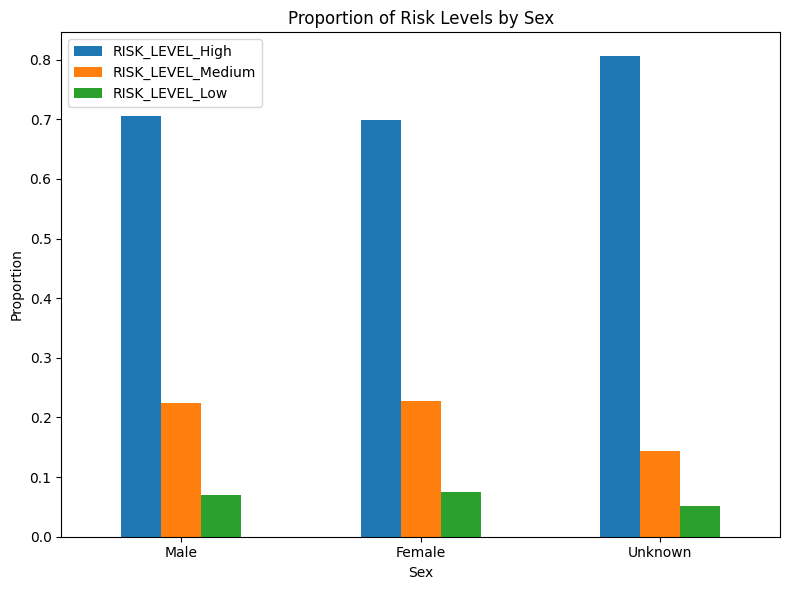

In [71]:
Violence_Reduction_df['SEX'] = pd.NA 

Violence_Reduction_df.loc[Violence_Reduction_df['SEX_M'] == 1, 'SEX'] = 'Male'
Violence_Reduction_df.loc[Violence_Reduction_df['SEX_M'] == 0, 'SEX'] = 'Female'
if 'SEX_UNKNOWN' in Violence_Reduction_df.columns:
    Violence_Reduction_df.loc[Violence_Reduction_df['SEX_UNKNOWN'] == 1, 'SEX'] = 'Unknown'

sex_categories = ['Male', 'Female', 'Unknown'] 
Violence_Reduction_df['SEX'] = pd.Categorical(Violence_Reduction_df['SEX'], categories=sex_categories)

sex_risk_counts = Violence_Reduction_df.groupby('SEX')[['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low']].sum()
sex_risk_proportions = sex_risk_counts.div(sex_risk_counts.sum(axis=1), axis=0)

sex_risk_proportions.plot(kind='bar', stacked=False, figsize=(8, 6))
plt.title('Proportion of Risk Levels by Sex')
plt.xlabel('Sex')
plt.ylabel('Proportion')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

### 2.. Separate Features (X) and Target (y) :

In [72]:
X = Violence_Reduction_df.drop(['RISK_LEVEL_High', 'RISK_LEVEL_Medium', 'RISK_LEVEL_Low','RISK_LEVEL_Numeric'], axis=1, errors='ignore')
y = Violence_Reduction_df[['RISK_LEVEL_Numeric']]

In [73]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54484 entries, 0 to 54483
Data columns (total 80 columns):
 #   Column                                         Non-Null Count  Dtype         
---  ------                                         --------------  -----         
 0   DATE                                           54484 non-null  datetime64[ns]
 1   LATITUDE                                       54484 non-null  float64       
 2   LONGITUDE                                      54484 non-null  float64       
 3   LOCATION_DESCRIPTION                           54484 non-null  object        
 4   GUNSHOT_INJURY                                 54484 non-null  int32         
 5   AGE_MIDPOINT                                   54484 non-null  int32         
 6   VICTIMIZATION_PRIMARY_CRIMINAL SEXUAL ASSAULT  54484 non-null  int32         
 7   VICTIMIZATION_PRIMARY_HOMICIDE                 54484 non-null  int32         
 8   VICTIMIZATION_PRIMARY_NON-FATAL                54484 non

In [74]:
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54484 entries, 0 to 54483
Data columns (total 1 columns):
 #   Column              Non-Null Count  Dtype
---  ------              --------------  -----
 0   RISK_LEVEL_Numeric  54484 non-null  int32
dtypes: int32(1)
memory usage: 213.0 KB


In [75]:
y.head()

,RISK_LEVEL_Numeric
0,0
1,0
2,0
3,0
4,2


In [76]:
# Convert the DATE column to Unix timestamps
X['DATE'] = X['DATE'].apply(lambda x: x.timestamp())

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_cols = X.select_dtypes(include=['number']).columns.tolist()

# Handle LOCATION_DESCRIPTION
top_locations = X['LOCATION_DESCRIPTION'].value_counts().nlargest(10).index  # Adjust N
X['LOCATION_DESCRIPTION'] = X['LOCATION_DESCRIPTION'].apply(lambda x: x if x in top_locations else 'Other')

# Feature Hashing for LOCATION_DESCRIPTION
hasher = FeatureHasher(n_features=20, input_type='string') # adjust n_features
hashed_features = hasher.fit_transform([[str(val)] for val in X['LOCATION_DESCRIPTION'].values]) #.values is the fix.
hashed_df = pd.DataFrame(hashed_features.toarray(), index=X.index, columns=[f'hashed_location_{i}' for i in range(20)])
X = pd.concat([X.drop('LOCATION_DESCRIPTION', axis=1), hashed_df], axis=1)

# One-hot encode other categorical columns
categorical_cols = [col for col in categorical_cols if col != 'LOCATION_DESCRIPTION'] #remove location description from list.

transformers = []

if numerical_cols:
    transformers.append(('num', StandardScaler(), numerical_cols))

if categorical_cols:
    transformers.append(('cat', OneHotEncoder(drop='first', handle_unknown='ignore'), categorical_cols))

transformer = ColumnTransformer(transformers, remainder='drop')

### 2.8. Splitting the dataset :

In [77]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [78]:
print("X_train shape:", X_train.shape)
print("X_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

X_train shape: (43587, 99)
X_test shape: (10897, 99)
y_train shape: (43587, 1)
y_test shape: (10897, 1)


In [79]:
y.value_counts()

RISK_LEVEL_Numeric
0                     38476
2                     12178
1                      3830
Name: count, dtype: int64

## 3. Exploratory Data Analysis(EDA) :

### 3.1. Data Understanding :

#### 3.1.1. Data Overview and Initial Inspection :

In [80]:
print("DataFrame Shape:", Violence_Reduction_df.shape)
print("\nData Types:\n", Violence_Reduction_df.dtypes)
print("\nMissing Values:\n", Violence_Reduction_df.isnull().sum())

DataFrame Shape: (54484, 84)

Data Types:
 DATE                    datetime64[ns]
LATITUDE                       float64
LONGITUDE                      float64
LOCATION_DESCRIPTION            object
GUNSHOT_INJURY                   int32
                             ...      
RISK_LEVEL_Low                    bool
RISK_LEVEL_Medium                 bool
RISK_LEVEL_Numeric               int32
LOCATION_GROUP                  object
SEX                           category
Length: 84, dtype: object

Missing Values:
 DATE                    0
LATITUDE                0
LONGITUDE               0
LOCATION_DESCRIPTION    0
GUNSHOT_INJURY          0
                       ..
RISK_LEVEL_Low          0
RISK_LEVEL_Medium       0
RISK_LEVEL_Numeric      0
LOCATION_GROUP          0
SEX                     0
Length: 84, dtype: int64


#### 3.1.2. Missing Data Analysis - Visualize missing values :

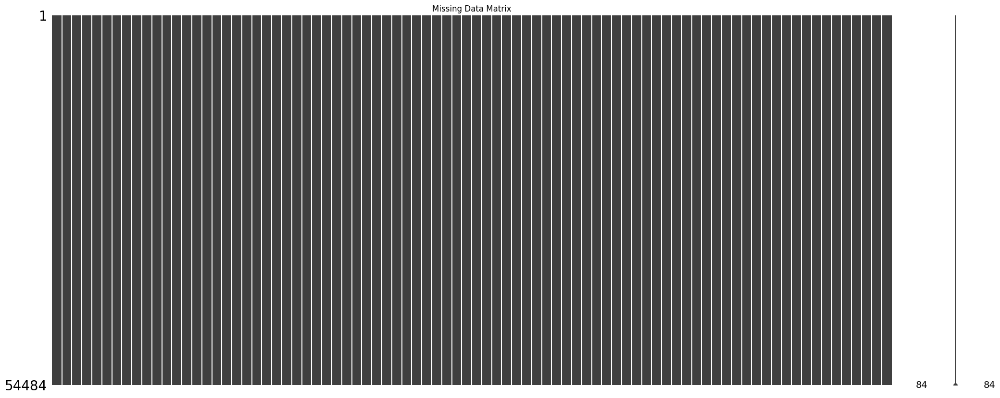

In [81]:
msno.matrix(Violence_Reduction_df)
plt.title("Missing Data Matrix")
plt.show()

In [82]:
print("\nSummary Statistics (Numerical):\n", Violence_Reduction_df.describe())
print("\nSummary Statistics (Categorical):\n", Violence_Reduction_df.describe(include=['O'])) 


Summary Statistics (Numerical):
                                 DATE      LATITUDE     LONGITUDE  \
count                          54484  54484.000000  54484.000000   
mean   2013-11-10 13:58:59.889894400     41.817862    -87.668461   
min              1991-01-01 00:20:00     41.644151    -87.846051   
25%              2010-09-30 23:30:15     41.759399    -87.713929   
50%              2016-04-01 23:12:30     41.805971    -87.666245   
75%              2020-08-22 01:13:00     41.880431    -87.625650   
max              2025-02-04 21:55:00     42.023220    -87.524801   
std                              NaN      0.077418      0.056063   

       GUNSHOT_INJURY  AGE_MIDPOINT  \
count    54484.000000  54484.000000   
mean         0.940239     24.459676   
min          0.000000      9.000000   
25%          1.000000     24.000000   
50%          1.000000     24.000000   
75%          1.000000     34.000000   
max          1.000000     44.000000   
std          0.237045     10.556103   

 

### 3.2. Spatial Analysis :

#### 3.2.1. Spatial Pattern Recognition (Hotspot Analysis):

Density: [13.65875128 26.71297809 24.60155656 ... 58.59022933 46.68965788
 61.79068469]
Threshold: 75.93651621111862
Hotspots Lat Min/Max: 41.77601966894669 41.90278834585807
Hotspots Lon Min/Max: -87.76042465387965 -87.61063


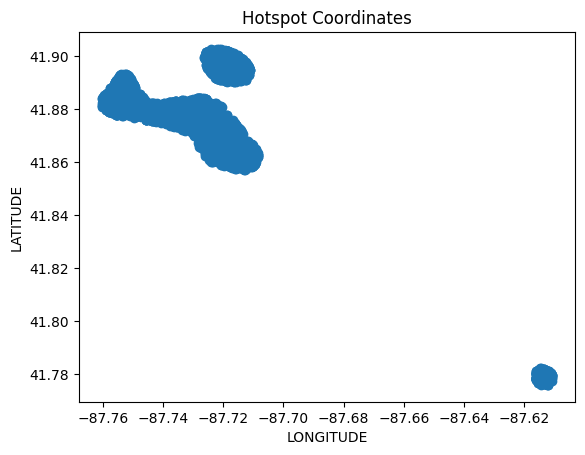

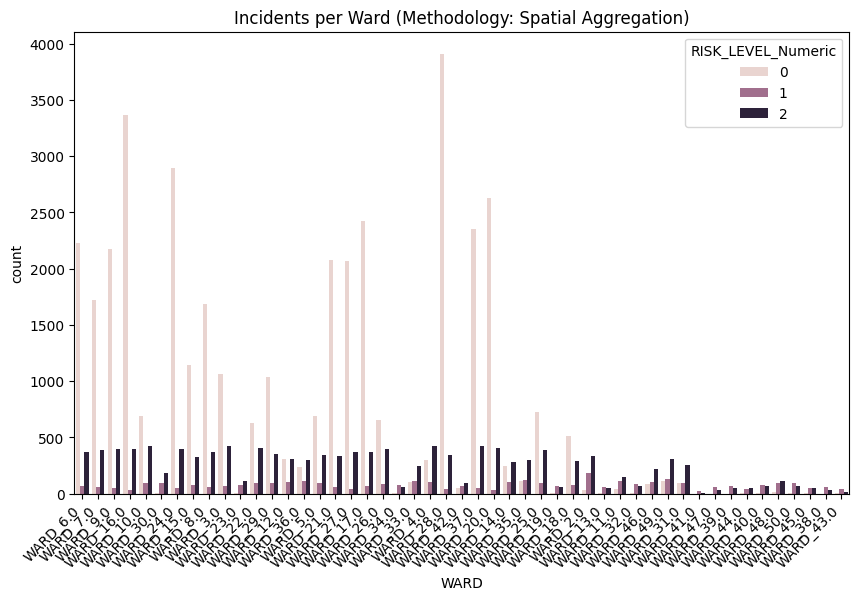

In [83]:
if 'LATITUDE' in Violence_Reduction_df.columns and 'LONGITUDE' in Violence_Reduction_df.columns:
    m = folium.Map(location=[Violence_Reduction_df['LATITUDE'].mean(), Violence_Reduction_df['LONGITUDE'].mean()], zoom_start=12)
    for index, row in Violence_Reduction_df.iterrows():      
     # Robust Popup Handling
        popup_text = "Risk Level: " + str(row['RISK_LEVEL_Numeric'])
        folium.Marker([row['LATITUDE'], row['LONGITUDE']], popup=popup_text).add_to(m)
    m
    # Density-Based Hotspot Detection
    try:
         # 1. Prepare Data
        coords = Violence_Reduction_df[['LONGITUDE', 'LATITUDE']].values

        # 2. Kernel Density Estimation
        kde = KernelDensity(bandwidth=0.005)  # Adjusted bandwidth
        kde.fit(coords)
        density = np.exp(kde.score_samples(coords))

        # 3. Identify Hotspots (Threshold based on density)
        threshold = np.percentile(density, 90)  # Adjusted percentile
        hotspots = Violence_Reduction_df[density > threshold]
        # Explicitly convert to numeric types
        hotspots['LATITUDE'] = pd.to_numeric(hotspots['LATITUDE'], errors='coerce')
        hotspots['LONGITUDE'] = pd.to_numeric(hotspots['LONGITUDE'], errors='coerce')

        # Filter outliers based on chicago coordinates.
        hotspots = hotspots[(hotspots['LATITUDE'] >= 41.6) & (hotspots['LATITUDE'] <= 42.0) &
                            (hotspots['LONGITUDE'] >= -87.9) & (hotspots['LONGITUDE'] <= -87.5)]

        print("Density:", density)
        print("Threshold:", threshold)
        print("Hotspots Lat Min/Max:", hotspots['LATITUDE'].min(), hotspots['LATITUDE'].max())
        print("Hotspots Lon Min/Max:", hotspots['LONGITUDE'].min(), hotspots['LONGITUDE'].max())

        # 4. Visualize Hotspots
        
        if not hotspots.empty:
            m_hotspots = folium.Map(location=[41.88, -87.63], zoom_start=11) #(tiles='CartoDB dark_matter'or'CartoDB positron')

            # Heatmap
            heatmap_data = hotspots[['LATITUDE', 'LONGITUDE']].values.tolist()
            HeatMap(heatmap_data).add_to(m_hotspots)

            # Marker Cluster
            marker_cluster = MarkerCluster().add_to(m_hotspots)
            for index, row in hotspots.iterrows():
                folium.Marker([row['LATITUDE'], row['LONGITUDE']], popup="Hotspot").add_to(marker_cluster)

            # Directly display the map using HTML
            html_map = m_hotspots._repr_html_()
            display(HTML(html_map))

            # Scatter Plot
            plt.scatter(hotspots['LONGITUDE'], hotspots['LATITUDE'])
            plt.xlabel("LONGITUDE")
            plt.ylabel("LATITUDE")
            plt.title("Hotspot Coordinates")
            plt.show()

        else:
            print("No hotspots found to visualize.")

    except Exception as e:
        print(f"Hotspot Analysis Error: {e}")
# Handle one-hot encoded 'ward' columns
ward_columns = [col for col in Violence_Reduction_df.columns if col.startswith('WARD_')] #Get ward columns.

if ward_columns:
    # Create a 'WARD' column with single labels
    Violence_Reduction_df['WARD'] = Violence_Reduction_df[ward_columns].idxmax(axis=1)

    plt.figure(figsize=(10, 6))
    sns.countplot(x='WARD', hue='RISK_LEVEL_Numeric', data=Violence_Reduction_df)
    plt.title("Incidents per Ward (Methodology: Spatial Aggregation)")
    plt.xticks(rotation=45, ha='right')
    plt.show()
else:
    print("No one-hot encoded 'WARD' columns found.")

### 3.3. Temporal Analysis :

#### 3.3.1. Temporal Pattern Recognition :

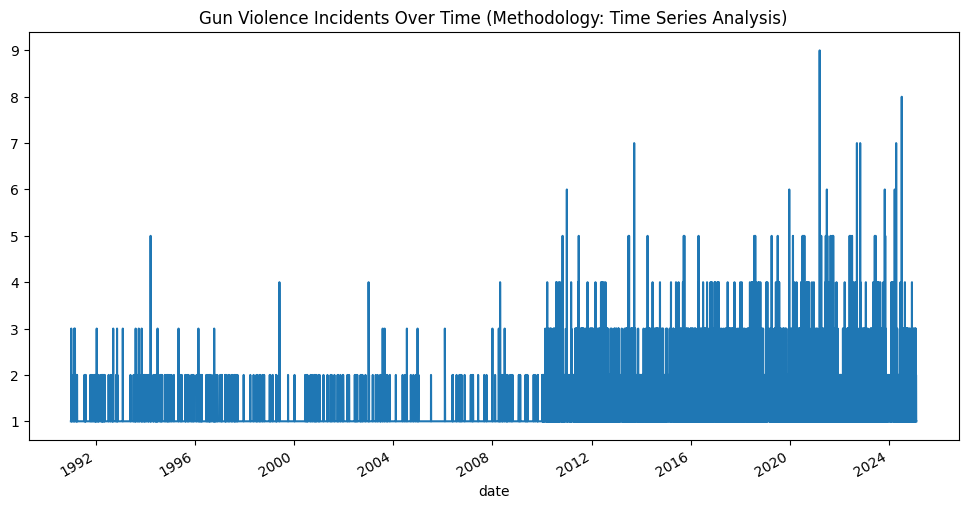

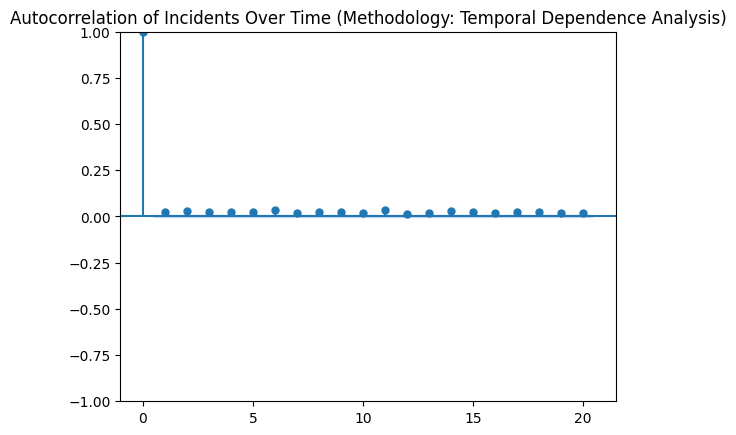

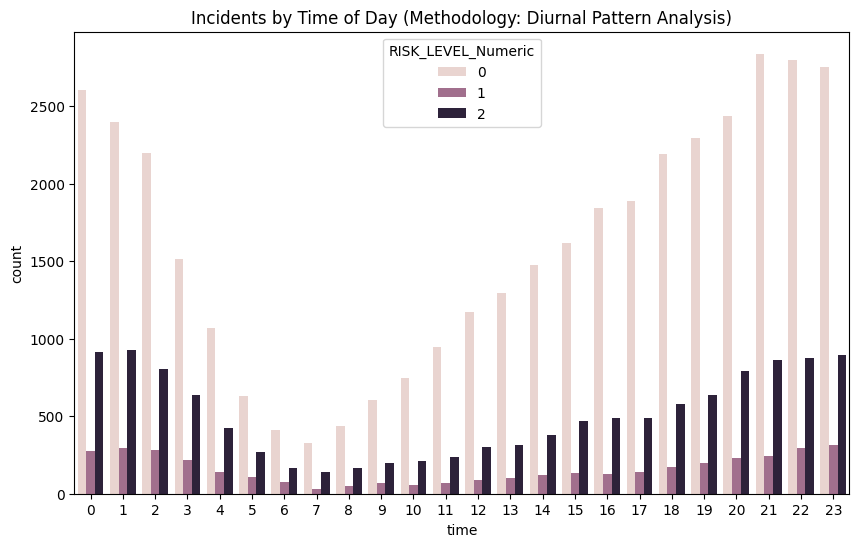

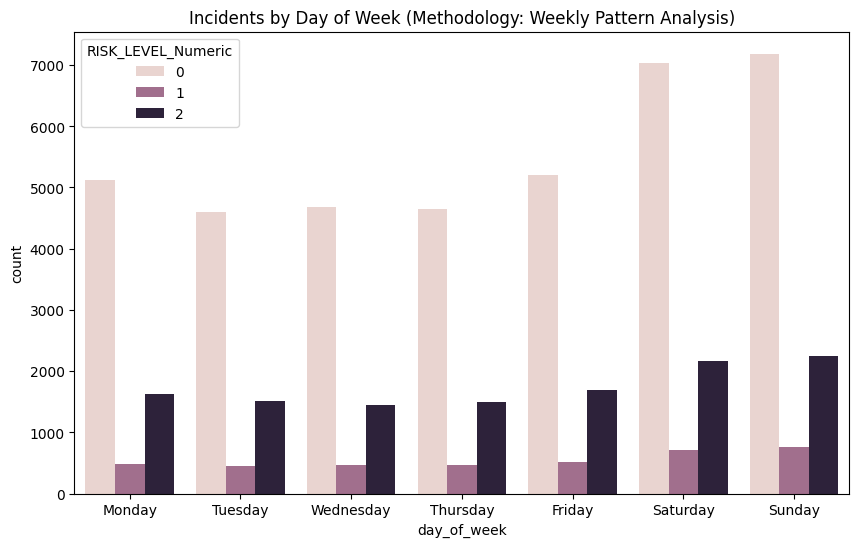

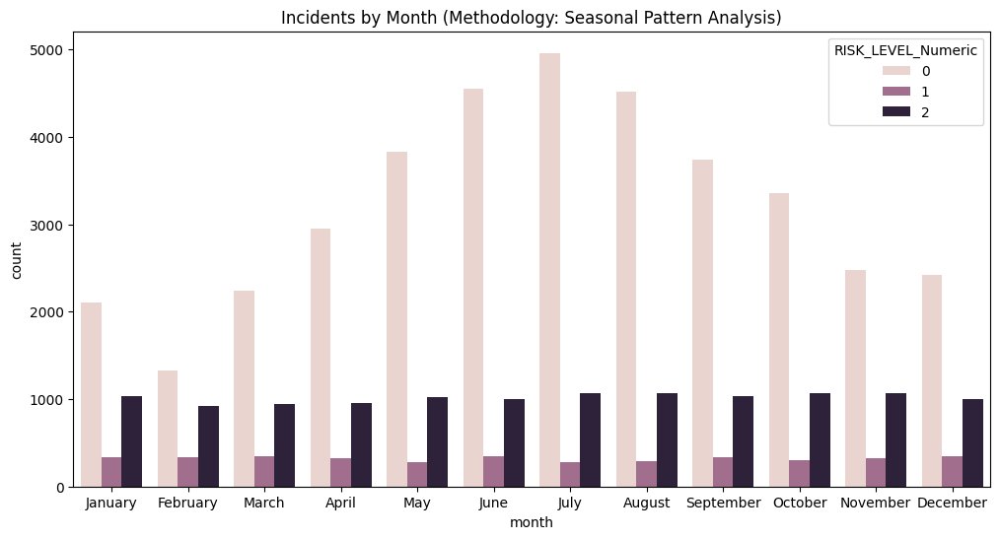

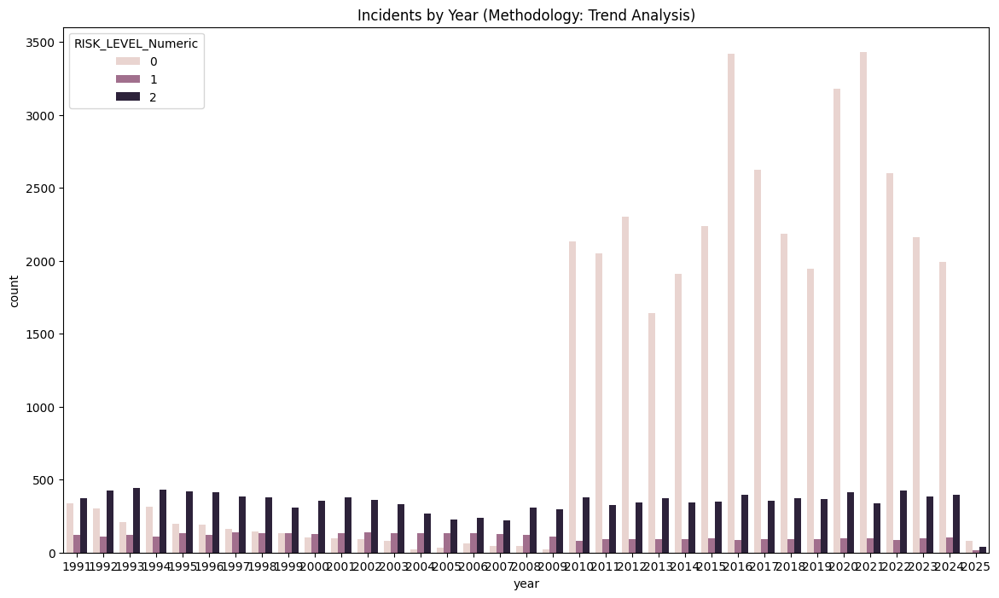

In [84]:
if 'DATE' in Violence_Reduction_df.columns:
    Violence_Reduction_df['date'] = pd.to_datetime(Violence_Reduction_df['DATE'])  # Ensure 'date' is datetime
    Violence_Reduction_df['date'].value_counts().sort_index().plot(figsize=(12, 6))
    plt.title("Gun Violence Incidents Over Time (Methodology: Time Series Analysis)")
    plt.show()

    if len(Violence_Reduction_df['date'].unique()) > 10: #check if there is enough data for autocorrelation
        plot_acf(Violence_Reduction_df['date'].value_counts().sort_index(), lags=20) #adjust lags as needed.
        plt.title("Autocorrelation of Incidents Over Time (Methodology: Temporal Dependence Analysis)")
        plt.show()

if 'DATE' in Violence_Reduction_df.columns:
    Violence_Reduction_df['time'] = pd.to_datetime(Violence_Reduction_df['DATE'], format='%H:%M:%S').dt.hour # Extract hour
    plt.figure(figsize=(10, 6))
    sns.countplot(x='time', hue='RISK_LEVEL_Numeric', data=Violence_Reduction_df)
    plt.title("Incidents by Time of Day (Methodology: Diurnal Pattern Analysis)")
    plt.show()

if 'DATE' in Violence_Reduction_df.columns:
    Violence_Reduction_df['day_of_week'] = Violence_Reduction_df['DATE'].dt.day_name()
    plt.figure(figsize=(10, 6))
    sns.countplot(x='day_of_week', hue='RISK_LEVEL_Numeric', data=Violence_Reduction_df, order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
    plt.title("Incidents by Day of Week (Methodology: Weekly Pattern Analysis)")
    plt.show()

    Violence_Reduction_df['month'] = Violence_Reduction_df['DATE'].dt.month_name()
    plt.figure(figsize=(12, 6))
    sns.countplot(x='month', hue='RISK_LEVEL_Numeric', data=Violence_Reduction_df, order=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])
    plt.title("Incidents by Month (Methodology: Seasonal Pattern Analysis)")
    plt.show()

    Violence_Reduction_df['year'] = Violence_Reduction_df['DATE'].dt.year
    plt.figure(figsize=(14, 8))
    sns.countplot(x='year', hue='RISK_LEVEL_Numeric', data=Violence_Reduction_df)
    plt.title("Incidents by Year (Methodology: Trend Analysis)")
    plt.show()

### 3.4. Feature Relationships :

#### 3.4.1. Feature Interaction Analysis :

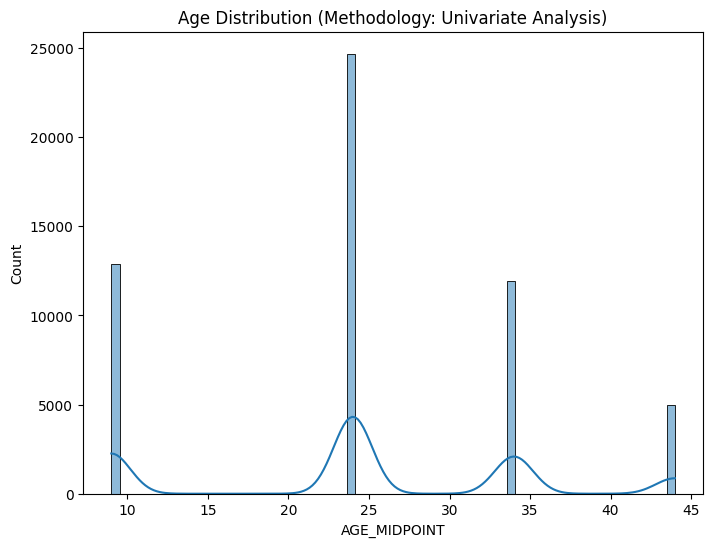

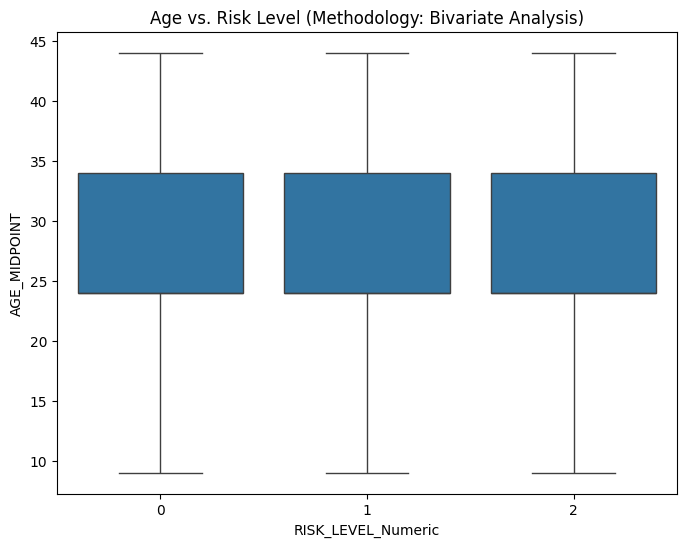

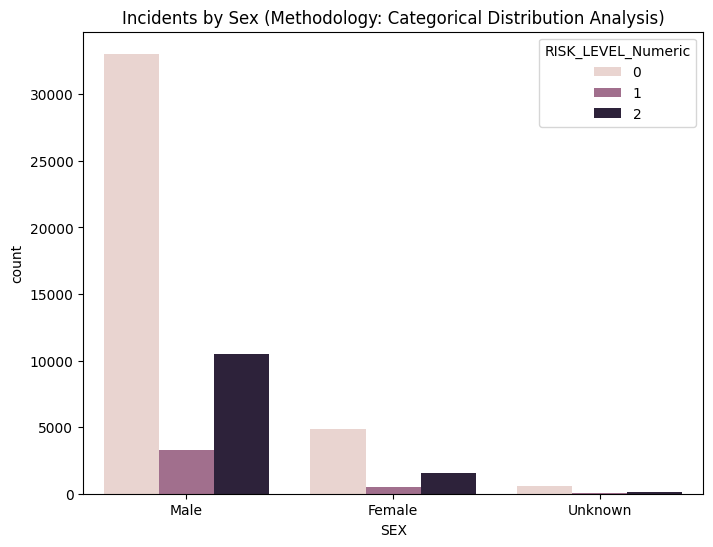

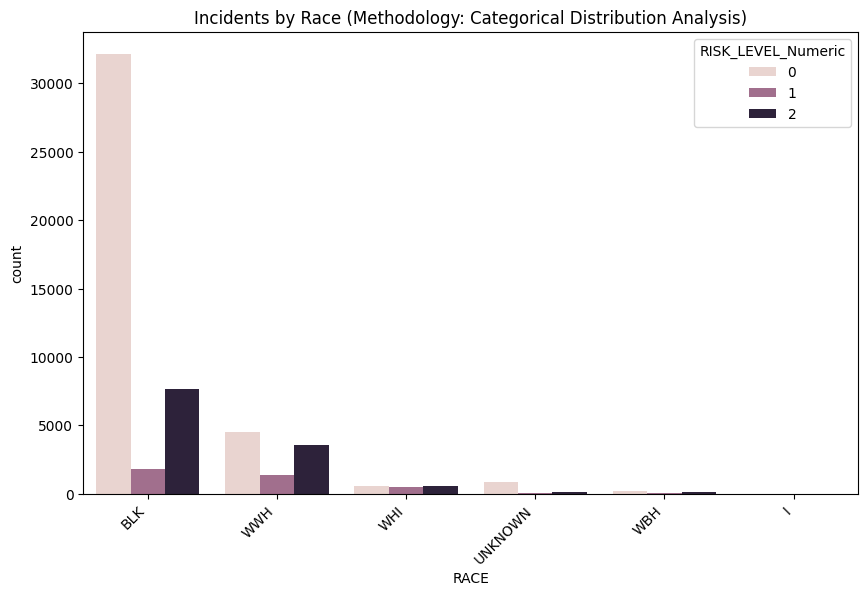

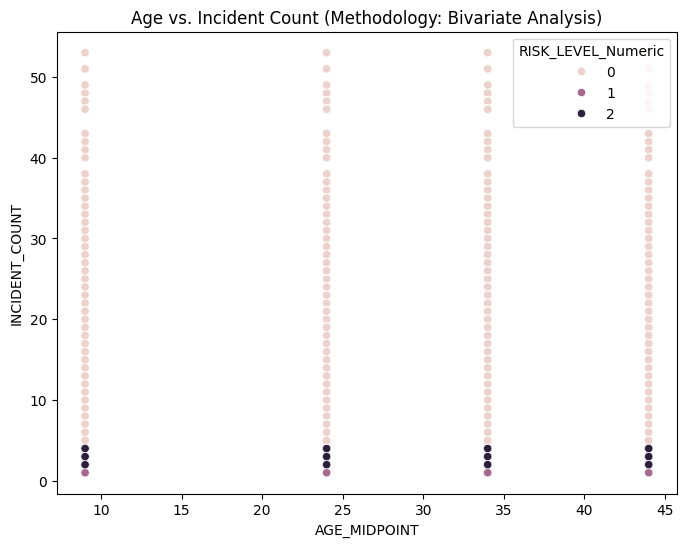

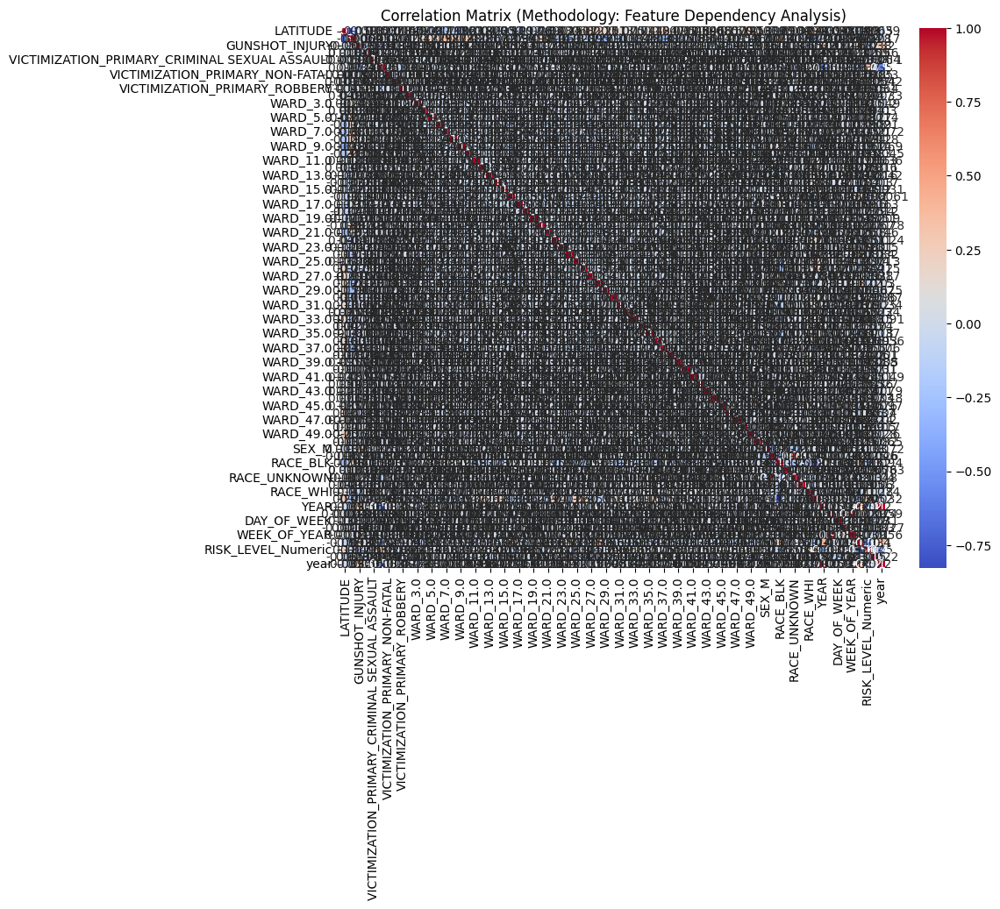

In [85]:
if 'AGE_MIDPOINT' in Violence_Reduction_df.columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(Violence_Reduction_df['AGE_MIDPOINT'], kde=True)
    plt.title("Age Distribution (Methodology: Univariate Analysis)")
    plt.show()

    plt.figure(figsize=(8, 6))
    sns.boxplot(x='RISK_LEVEL_Numeric', y='AGE_MIDPOINT', data=Violence_Reduction_df)
    plt.title("Age vs. Risk Level (Methodology: Bivariate Analysis)")
    plt.show()

if 'SEX' in Violence_Reduction_df.columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(x='SEX', hue='RISK_LEVEL_Numeric', data=Violence_Reduction_df)
    plt.title("Incidents by Sex (Methodology: Categorical Distribution Analysis)")
    plt.show()
# List of one-hot encoded race columns
race_columns = ['RACE_BLK', 'RACE_I', 'RACE_UNKNOWN', 'RACE_WBH','RACE_WHI','RACE_WWH'] #add all your race columns.

# Check if any race columns exist
if any(col in Violence_Reduction_df.columns for col in race_columns):
    # Create a new 'race' column
    Violence_Reduction_df['RACE'] = None  # Initialize the column

    for col in race_columns:
        race_name = col.replace('RACE_', '')  # Extract race name
        Violence_Reduction_df.loc[Violence_Reduction_df[col] == 1, 'RACE'] = race_name #assign race name.

    # Plot the countplot
    plt.figure(figsize=(10, 6))
    sns.countplot(x='RACE', hue='RISK_LEVEL_Numeric', data=Violence_Reduction_df)
    plt.title("Incidents by Race (Methodology: Categorical Distribution Analysis)")
    plt.xticks(rotation=45, ha='right')
    plt.show()
else:
    print("No race columns found in the DataFrame.")

if 'AGE_MIDPOINT' in Violence_Reduction_df.columns and 'INCIDENT_COUNT' in Violence_Reduction_df.columns:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='AGE_MIDPOINT', y='INCIDENT_COUNT', hue='RISK_LEVEL_Numeric', data=Violence_Reduction_df)
    plt.title("Age vs. Incident Count (Methodology: Bivariate Analysis)")
    plt.show()

# Correlation Matrix 
numerical_cols = Violence_Reduction_df.select_dtypes(include=np.number).columns #select numerical columns.
if len(numerical_cols) > 1 : #Make sure there is more than one numerical column.
    plt.figure(figsize=(10, 8))
    sns.heatmap(Violence_Reduction_df[numerical_cols].corr(), annot=True, cmap='coolwarm')
    plt.title("Correlation Matrix (Methodology: Feature Dependency Analysis)")
    plt.show()


### 3.5. Target Variable Analysis :

#### 3.5.1. Target Variable Distribution Analysis :

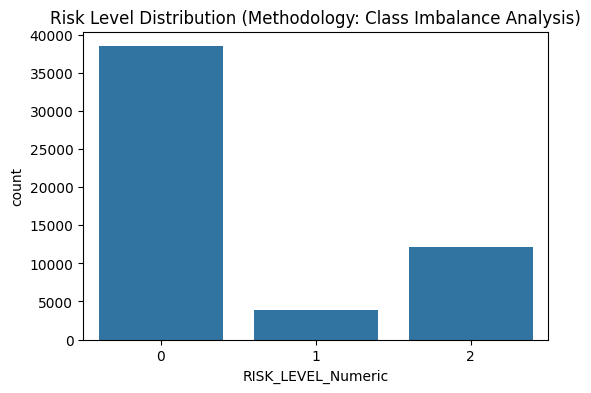


Risk Level Percentages:
 RISK_LEVEL_Numeric
0    70.618897
2    22.351516
1     7.029587
Name: proportion, dtype: float64


In [86]:
plt.figure(figsize=(6, 4))
sns.countplot(x='RISK_LEVEL_Numeric', data=Violence_Reduction_df)
plt.title("Risk Level Distribution (Methodology: Class Imbalance Analysis)")
plt.show()

print("\nRisk Level Percentages:\n", Violence_Reduction_df['RISK_LEVEL_Numeric'].value_counts(normalize=True) * 100)

## 4. Model Development :

### 4.1. SMOTE (Class Imbalance Handling) :

In [87]:
# Print data types
print(X_train.dtypes)

# Identify non-numeric columns
non_numeric_cols = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

# Handle non-numeric columns
for col in non_numeric_cols:
    X_train[col] = pd.to_numeric(X_train[col], errors='coerce')  # Convert to numeric, NaN for errors

# Remove nan values
X_train = X_train.fillna(0)

# Ensure DATE is numeric
if 'DATE' in X_train.columns:
    if pd.api.types.is_datetime64_any_dtype(X_train['DATE']):
        X_train['DATE'] = X_train['DATE'].apply(lambda x: x.timestamp())
    X_train['DATE'] = pd.to_numeric(X_train['DATE'], errors='coerce')
    X_train['DATE'] = X_train['DATE'].fillna(0) #remove nan values

# Print the data type of the DATE column
if 'DATE' in X_train.columns:
    print(f"DATE column dtype: {X_train['DATE'].dtype}")

# Explicitly convert Timestamp objects to numeric
for col in X_train.columns:
    if pd.api.types.is_datetime64_any_dtype(X_train[col]):
        X_train[col] = pd.to_numeric(X_train[col].apply(lambda x: x.timestamp()), errors='coerce')
    else:
        try:
            X_train[col] = pd.to_numeric(X_train[col], errors='coerce')
        except:
            pass
X_train = X_train.fillna(0)

# Convert to NumPy array
X_train_dense = X_train.to_numpy()

# Apply SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_dense, y_train)

# Convert back to DataFrame
X_train_resampled = pd.DataFrame(X_train_resampled, columns=X_train.columns)

# Apply the transformer to resampled data and convert to DataFrames
feature_names = transformer.fit_transform(X_train_resampled) #fit and transform.
feature_names = transformer.get_feature_names_out() #get feature names after fitting.
X_train_transformed = pd.DataFrame(transformer.transform(X_train_resampled), columns=feature_names)
X_test_transformed = pd.DataFrame(transformer.transform(X_test), columns=feature_names)


# After SMOTE and transformer
feature_names_train = transformer.get_feature_names_out()
print("Feature names train:", feature_names_train)
print("X_train shape: ", X_train_transformed.shape)
print("X_test shape: ", X_test_transformed.shape)

DATE                  float64
LATITUDE              float64
LONGITUDE             float64
GUNSHOT_INJURY          int32
AGE_MIDPOINT            int32
                       ...   
hashed_location_15    float64
hashed_location_16    float64
hashed_location_17    float64
hashed_location_18    float64
hashed_location_19    float64
Length: 99, dtype: object
DATE column dtype: float64
Feature names train: ['num__DATE' 'num__LATITUDE' 'num__LONGITUDE' 'num__GUNSHOT_INJURY'
 'num__AGE_MIDPOINT' 'num__VICTIMIZATION_PRIMARY_CRIMINAL SEXUAL ASSAULT'
 'num__VICTIMIZATION_PRIMARY_HOMICIDE'
 'num__VICTIMIZATION_PRIMARY_NON-FATAL'
 'num__VICTIMIZATION_PRIMARY_PUBLIC PEACE VIOLATION'
 'num__VICTIMIZATION_PRIMARY_ROBBERY' 'num__WARD_2.0' 'num__WARD_3.0'
 'num__WARD_4.0' 'num__WARD_5.0' 'num__WARD_6.0' 'num__WARD_7.0'
 'num__WARD_8.0' 'num__WARD_9.0' 'num__WARD_10.0' 'num__WARD_11.0'
 'num__WARD_12.0' 'num__WARD_13.0' 'num__WARD_14.0' 'num__WARD_15.0'
 'num__WARD_16.0' 'num__WARD_17.0' 'num__WARD_18.0'

### 4.2. Pipelines and Parameter Grids :

In [88]:
# Custom KerasClassifier Wrapper
class SimpleKerasClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, model_func, epochs=10, batch_size=32, verbose=0):
        self.model_func = model_func
        self.epochs = epochs
        self.batch_size = batch_size
        self.verbose = verbose
        self._keras_model = None

    def fit(self, X, y, **kwargs):
        self._keras_model = self.model_func(X.shape[1], len(np.unique(y)))
        self._keras_model.fit(X, y, epochs=self.epochs, batch_size=self.batch_size, verbose=self.verbose, **kwargs)
        return self

    def predict(self, X, **kwargs):
        check_is_fitted(self, '_keras_model')
        return np.argmax(self._keras_model.predict(X, **kwargs), axis=-1)

    def predict_proba(self, X, **kwargs):
        check_is_fitted(self, '_keras_model')
        return self._keras_model.predict(X, **kwargs)

    def __sklearn_is_fitted__(self):
        return hasattr(self, '_keras_model') and self._keras_model is not None

def create_nn(input_dim, num_classes):
    model = keras.Sequential([
        keras.layers.Dense(128, activation='relu', input_shape=(input_dim,)),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(64, activation='relu'),
        keras.layers.Dropout(0.5),
        keras.layers.Dense(num_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

In [89]:
pipelines = {
    'Logistic Regression': Pipeline([
        ('scaler', StandardScaler()),
        ('model', LogisticRegression(random_state=42, solver='lbfgs', max_iter=1000))
    ]),
    'Random Forest': Pipeline([
        ('scaler', StandardScaler()),
        ('model', RandomForestClassifier(random_state=42))
    ]),
    'XGBoost': Pipeline([
        ('scaler', StandardScaler()),
        ('model', XGBClassifier(random_state=42))
    ]),
    'SGD SVM': Pipeline([
        ('scaler', StandardScaler()),
        ('model', OneVsRestClassifier(CalibratedClassifierCV(SGDClassifier(loss='hinge', random_state=42, n_jobs=-1))))
    ]),
    'KNN': Pipeline([
        ('scaler', StandardScaler()),
        ('model', KNeighborsClassifier())
    ]),
    'Neural Network': Pipeline([
        ('scaler', StandardScaler()),
        ('model', SimpleKerasClassifier(model_func=create_nn, verbose=0))
    ])
}

param_grids = {
    'Logistic Regression': {
        'model__C': [0.1, 1, 10],
        'model__multi_class': ['ovr']
    },
    'Random Forest': {
        'model__n_estimators': [100, 200],
        'model__max_depth': [10, 20]
    },
    'XGBoost': {
        'model__n_estimators': [100, 200],
        'model__max_depth': [3, 5]
    },
    'SGD SVM': {
        'model__estimator__estimator__alpha': np.logspace(-5, -1, 5)
    },
    'KNN': {
        'model__n_neighbors': [3, 5, 7]
    },
    'Neural Network':{
        'model__epochs': [10, 20],
        'model__batch_size': [32, 64]
    }
}

### 4.3. GridSearchCV and Model Training :

______________________________________________________________________

		**.... Logistic Regression ....**
______________________________________________________________________


Fitting 3 folds for each of 3 candidates, totalling 9 fits


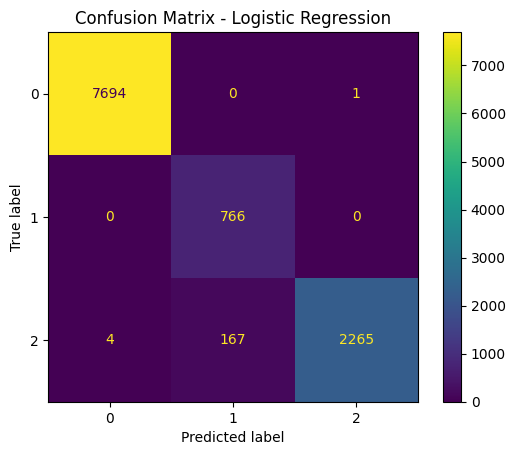

______________________________________________________________________

		**.... Random Forest ....**
______________________________________________________________________


Fitting 3 folds for each of 4 candidates, totalling 12 fits


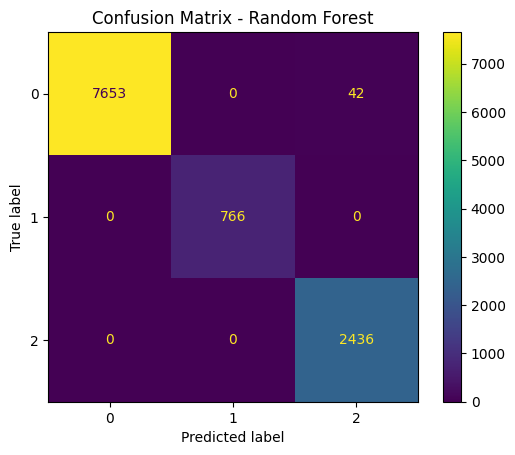

______________________________________________________________________

		**.... XGBoost ....**
______________________________________________________________________


Fitting 3 folds for each of 4 candidates, totalling 12 fits


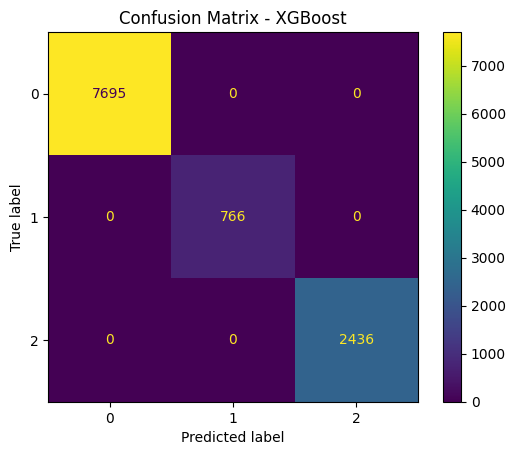

______________________________________________________________________

		**.... SGD SVM ....**
______________________________________________________________________


Fitting 3 folds for each of 5 candidates, totalling 15 fits


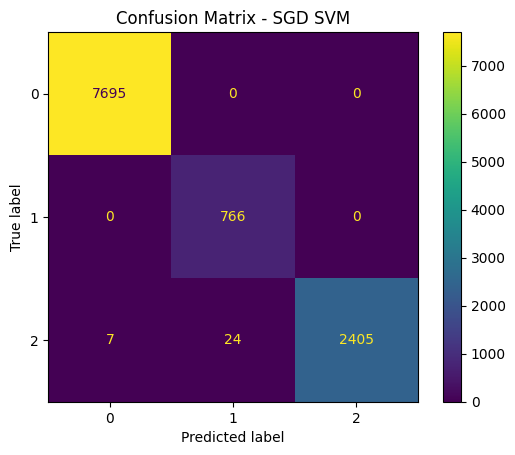

______________________________________________________________________

		**.... KNN ....**
______________________________________________________________________


Fitting 3 folds for each of 3 candidates, totalling 9 fits


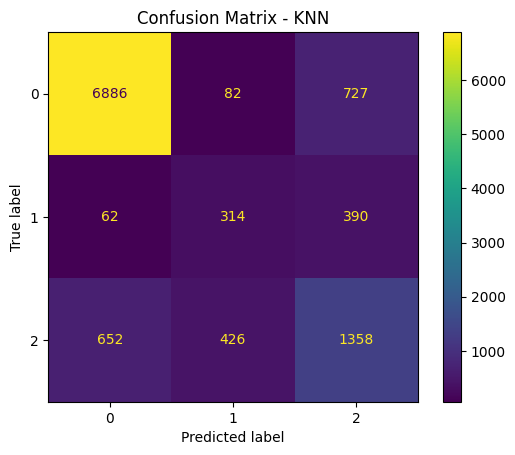

______________________________________________________________________

		**.... Neural Network ....**
______________________________________________________________________


Fitting 3 folds for each of 4 candidates, totalling 12 fits
341/341 ━━━━━━━━━━━━━━━━━━━━ 0s 698us/step
341/341 ━━━━━━━━━━━━━━━━━━━━ 0s 651us/step


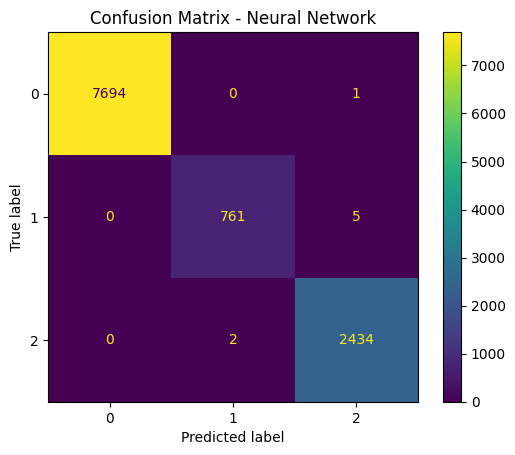

In [90]:
results = {}
best_model_name = None
best_f1 = -1

for model_name, pipeline in pipelines.items():
    print("_" * 70)
    print(f"\n\t\t**.... {model_name} ....**")
    print("_" * 70)
    print("\n")

    if model_name == 'SGD SVM':
        grid_search = RandomizedSearchCV(pipeline, param_distributions=param_grids[model_name], n_iter=10, cv=3, scoring='accuracy', n_jobs=-1, verbose=1)
    else:
        grid_search = GridSearchCV(pipeline, param_grids[model_name], cv=3, scoring='roc_auc' if model_name != "Neural Network" else 'accuracy', n_jobs=-1, verbose=1)

    grid_search.fit(X_train_transformed, y_train_resampled)
    best_model = grid_search.best_estimator_
    best_params = grid_search.best_params_
    y_pred = best_model.predict(X_test_transformed)
    y_pred_probs = best_model.predict_proba(X_test_transformed) if hasattr(best_model, "predict_proba") else None
 
   # Calculate ROC AUC for SGD SVM and Neural Network
    if model_name == 'SGD SVM':
        if hasattr(best_model, "predict_proba"):
            y_pred_probs = best_model.predict_proba(X_test_transformed)
            roc_auc = roc_auc_score(y_test, y_pred_probs, multi_class='ovr')
        else:
            roc_auc = "N/A (predict_proba not available)"
    elif model_name == "Neural Network" and y_pred_probs is not None:
        roc_auc = roc_auc_score(y_test, y_pred_probs, multi_class='ovr')
    elif y_pred_probs is not None:
        roc_auc = roc_auc_score(y_test, y_pred_probs, multi_class='ovr')
    else:
        roc_auc = "N/A"

    report = classification_report(y_test, y_pred, output_dict=True)
    f1 = report['weighted avg']['f1-score']
    accuracy = accuracy_score(y_test, y_pred)
    results[model_name] = {'classification_report': report, 'roc_auc': roc_auc, 'best_params': best_params, 'accuracy': accuracy}

    if f1 > best_f1:
        best_f1 = f1
        best_model_name = model_name

    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot()
    plt.title(f'Confusion Matrix - {model_name}')
    plt.show()

### 4.4.  Model Comparison :

In [91]:
print("\nModel Comparison:")
for model_name, metrics in results.items():
    print(f"\n{model_name}:")
    print(f"  Precision: {metrics['classification_report']['weighted avg']['precision']:.4f}")
    print(f"  Recall: {metrics['classification_report']['weighted avg']['recall']:.4f}")
    print(f"  F1-Score: {metrics['classification_report']['weighted avg']['f1-score']:.4f}")
    print(f"  Accuracy: {metrics['accuracy']:.4f}")
    print(f"  ROC AUC: {metrics['roc_auc']}")
    print(f"  Best Parameters: {metrics['best_params']}")

print(f"\nBest Model: {best_model_name} (F1-Score: {best_f1:.4f})")


Model Comparison:

Logistic Regression:
  Precision: 0.9870
  Recall: 0.9842
  F1-Score: 0.9847
  Accuracy: 0.9842
  ROC AUC: 0.9933039253456554
  Best Parameters: {'model__C': 0.1, 'model__multi_class': 'ovr'}

Random Forest:
  Precision: 0.9962
  Recall: 0.9961
  F1-Score: 0.9962
  Accuracy: 0.9961
  ROC AUC: 1.0
  Best Parameters: {'model__max_depth': 10, 'model__n_estimators': 100}

XGBoost:
  Precision: 1.0000
  Recall: 1.0000
  F1-Score: 1.0000
  Accuracy: 1.0000
  ROC AUC: 1.0
  Best Parameters: {'model__max_depth': 3, 'model__n_estimators': 100}

SGD SVM:
  Precision: 0.9972
  Recall: 0.9972
  F1-Score: 0.9972
  Accuracy: 0.9972
  ROC AUC: 0.9998380833903564
  Best Parameters: {'model__estimator__estimator__alpha': 1e-05}

KNN:
  Precision: 0.7893
  Recall: 0.7854
  F1-Score: 0.7873
  Accuracy: 0.7854
  ROC AUC: 0.818729385748532
  Best Parameters: {'model__n_neighbors': 3}

Neural Network:
  Precision: 0.9993
  Recall: 0.9993
  F1-Score: 0.9993
  Accuracy: 0.9993
  ROC AUC: 0

## The Best Model is : " XGBoost " 
### F1-Score : 1.0000 
### Accuracy : 100 %
### Best Parameters : {'model__max_depth': 3, 'model__n_estimators': 100}

## 5. Spatio-Temporal Analysis :

### 5.1. Hotspot Analysis  :

In [92]:
def hotspot_analysis(df, latitude_col='LATITUDE', longitude_col='LONGITUDE', timestamp_col='TIMESTAMP', risk_level_col='RISK_LEVEL_Numeric'):
    """Performs Spatio-Temporal Analysis: Hotspot and Temporal Trends."""

    print("\n--- Step 1: Hotspot Analysis Setup ---")

    if latitude_col in df.columns and longitude_col in df.columns:
        print("Latitude and Longitude columns found.")
    else:
        print("Latitude or Longitude columns not found. Skipping Hotspot Analysis.")
        return None

    print("\n--- Step 2: Prepare Coordinates for KDE ---")

    try:
        coords = df[[longitude_col, latitude_col]].values
        print("Coordinates prepared.")

        print("\n--- Step 3: Kernel Density Estimation (KDE) ---")
        
        kde = KernelDensity(bandwidth=0.005)
        kde.fit(coords)
        density = np.exp(kde.score_samples(coords))
        print("Kernel Density Estimation completed.")

        print("\n--- Step 4: Identify Hotspots (Thresholding) ---")

        threshold = np.percentile(density, 90)
        hotspots = df[density > threshold].copy()
        print("Hotspots identified based on threshold.")

        print("\n--- Step 5: Data Cleaning and Filtering ---")

        hotspots[latitude_col] = pd.to_numeric(hotspots[latitude_col], errors='coerce')
        hotspots[longitude_col] = pd.to_numeric(hotspots[longitude_col], errors='coerce')

        hotspots = hotspots[(hotspots[latitude_col] >= 41.6) & (hotspots[latitude_col] <= 42.0) &
                            (hotspots[longitude_col] >= -87.9) & (hotspots[longitude_col] <= -87.5)]
        print("Hotspots data cleaned and filtered.")
        
        print("\n--- Step 6: Visualize Hotspots (Folium Map) ---")
        m_hotspots = folium.Map(location=[41.88, -87.63], zoom_start=12)

        heatmap_data = hotspots[[latitude_col, longitude_col]].values.tolist()
        HeatMap(heatmap_data).add_to(m_hotspots)

        for index, row in hotspots.iterrows():
            # Assuming you have a 'hotspot_count' column
            count = row.get('hotspot_count', 1) # get the count, if the column does not exist, set to 1.
            folium.Marker([row[latitude_col], row[longitude_col]],popup=f"Hotspot Count: {count}").add_to(marker_cluster)

        display(HTML(m_hotspots._repr_html_()))
        
        print("\n--- Step 7: Visualize Hotspots (Scatter Plot with Risk Levels) ---")

        if not hotspots.empty:
            # Scale coordinates
            scaler = StandardScaler()
            scaled_coords = scaler.fit_transform(hotspots[[longitude_col, latitude_col]])

            # Apply K-means
            kmeans = KMeans(n_clusters=3, random_state=42)  
            cluster_labels = kmeans.fit_predict(scaled_coords)
            hotspots['CLUSTER_ID'] = cluster_labels
            print("Hotspots clustered using K-means.")

            # Visualize clusters
            plt.figure(figsize=(10, 8))
            sns.scatterplot(x=longitude_col, y=latitude_col, hue='CLUSTER_ID', data=hotspots, palette='viridis')
            plt.title("Hotspot Clusters (K-means)")
            plt.xlabel("LONGITUDE")
            plt.ylabel("LATITUDE")
            plt.show()

            print("\n--- Step 8: Data Preparation and GeoDataFrame Creation ---")
            print("Converting to GeoDataFrame...")
            gdf = gpd.GeoDataFrame(df, geometry=[Point(xy) for xy in zip(df[longitude_col], df[latitude_col])])
            print("Converting timestamp column to datetime...")
            gdf[timestamp_col] = pd.to_datetime(gdf[timestamp_col])
            print("GeoDataFrame created.")

            print("\n--- Step 9: Hotspot Analysis (Local Moran's I) ---")
            print("Creating spatial weights...")
            w = weights.distance.KNN.from_dataframe(gdf, k=5)  # Adjust k as needed
            print("Calculating Local Moran's I...")
            moran_loc = esda.Moran_Local(gdf[risk_level_col].values, w)
            print("Local Moran's I calculated.")

            print("\n--- Step 10: Visualize Hotspots on Folium Map ---")
            print("Creating Folium map...")
            m_hotspots = folium.Map(location=[gdf[latitude_col].mean(), gdf[longitude_col].mean()], zoom_start=12)
            print("Adding hotspot markers...")
            for idx, row in gdf.iterrows():
                if moran_loc.p_sim[idx] <= 0.05:  # Significant hotspots (p < 0.05)
                    folium.CircleMarker(
                    location=[row[latitude_col], row[longitude_col]],
                    radius=5,
                    color='red',
                    fill=True,
                    fill_color='red',
                    fill_opacity=0.6,
                    popup=f"Moran's I: {moran_loc.Is[idx]:.2f}").add_to(m_hotspots)
            print("Displaying Folium map...")
            display(HTML(m_hotspots._repr_html_()))
            print("Hotspot visualization complete.")

            print("\n--- Step 11: Spatial Clustering (K-Means) ---")
            print("Preparing spatial data...")
            spatial_data = gdf[[latitude_col, longitude_col]].copy()
            print("Scaling spatial data...")
            scaler = StandardScaler()
            scaled_spatial = scaler.fit_transform(spatial_data)
            print("Performing K-Means clustering...")
            kmeans_spatial = KMeans(n_clusters=num_spatial_clusters, random_state=42)
            spatial_clusters = kmeans_spatial.fit_predict(scaled_spatial)
            gdf['Spatial_Cluster'] = spatial_clusters
            print("Spatial clustering complete.")

            print("\n--- Step 12: Visualize Spatial Clusters on Folium Map ---")
            print("Creating Folium map for clusters...")
            m_clusters = folium.Map(location=[gdf[latitude_col].mean(), gdf[longitude_col].mean()], zoom_start=12)
            print("Adding cluster markers...")
            for idx, row in gdf.iterrows():
                folium.CircleMarker(
                location=[row[latitude_col], row[longitude_col]],
                radius=5,
                color=plt.cm.viridis(row['Spatial_Cluster'] / num_spatial_clusters),
                fill=True,
                fill_color=plt.cm.viridis(row['Spatial_Cluster'] / num_spatial_clusters),
                fill_opacity=0.6,
                popup=f"Spatial Cluster: {row['Spatial_Cluster']}").add_to(m_clusters)
            print("Displaying Folium map...")
            display(HTML(m_clusters._repr_html_()))
            print("Spatial cluster visualization complete.")

        else:
            print("No hotspots found to visualize.")

    except Exception as e:
        print(f"Hotspot Analysis Error: {e}")


--- Step 1: Hotspot Analysis Setup ---
Latitude and Longitude columns found.

--- Step 2: Prepare Coordinates for KDE ---
Coordinates prepared.

--- Step 3: Kernel Density Estimation (KDE) ---
Kernel Density Estimation completed.

--- Step 4: Identify Hotspots (Thresholding) ---
Hotspots identified based on threshold.

--- Step 5: Data Cleaning and Filtering ---
Hotspots data cleaned and filtered.

--- Step 6: Visualize Hotspots (Folium Map) ---



--- Step 7: Visualize Hotspots (Scatter Plot with Risk Levels) ---
Hotspots clustered using K-means.


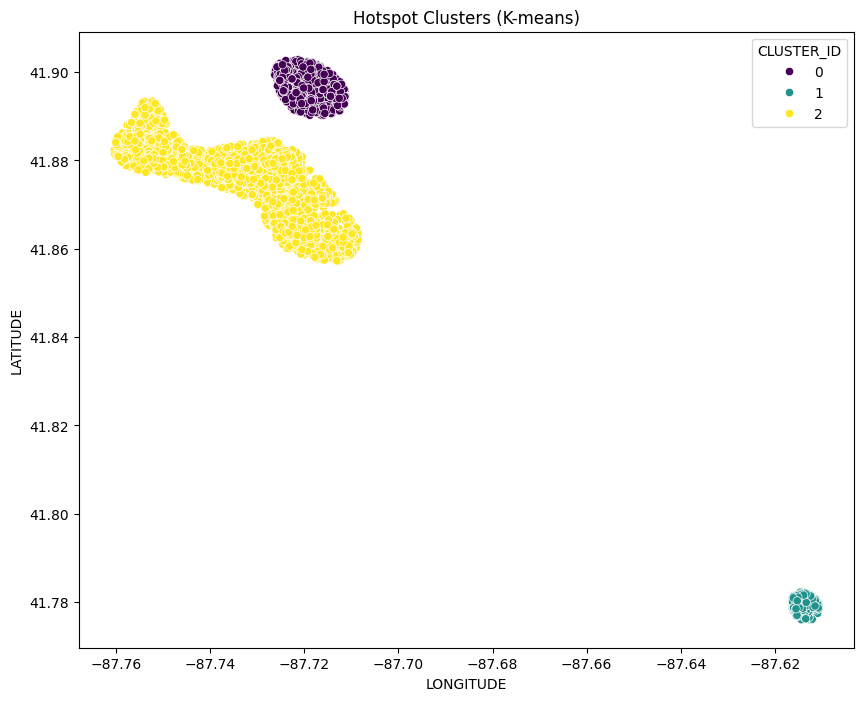


--- Step 8: Data Preparation and GeoDataFrame Creation ---
Converting to GeoDataFrame...
Converting timestamp column to datetime...
Hotspot Analysis Error: 'TIMESTAMP'


In [93]:
hotspot_analysis(Violence_Reduction_df)

### 5.2. Temporal Trends :

In [94]:
def temporal_trends(df, timestamp_col, risk_level_col, one_hot_features=None, race_col='RACE', sex_col='SEX', location_col='LOCATION_GROUP', num_temporal_clusters=3):
    """Performs Temporal Trends Analysis with Seaborn, STL decomposition, Temporal Clustering and mixed feature types."""

    print("\n--- Step 1: Temporal Trends Setup ---")

    if timestamp_col in df.columns:
        print("Timestamp column found.")
    else:
        print("Timestamp column not found. Skipping Temporal Trends Analysis.")
        return

    try:
        print("\n--- Step 2: Data Preprocessing for Temporal Analysis ---")

        if not pd.api.types.is_datetime64_any_dtype(df[timestamp_col]):
            print("Error: timestamp_col could not be converted to datetime.")
            return

        df['DATE'] = df[timestamp_col].dt.date
        df['HOUR'] = df[timestamp_col].dt.hour
        df['DAY_OF_WEEK'] = df[timestamp_col].dt.day_name()
        df['MONTH'] = df[timestamp_col].dt.month_name()
        print("Temporal data preprocessed.")

        print("\n--- Step 3: Daily Trends Visualization ---")

        daily_trends = df.groupby('DATE')[risk_level_col].count()
        daily_trends.index = pd.to_datetime(daily_trends.index).date

        plt.figure(figsize=(15, 5))
        sns.lineplot(x=daily_trends.index, y=daily_trends.values, color='skyblue')
        plt.title('Daily Incident Trends')
        plt.xlabel('Date')
        plt.ylabel('Incident Count')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

        # STL Decomposition
        try:
            daily_trends = daily_trends.sort_index()
            full_date_range = pd.date_range(daily_trends.index.min(), daily_trends.index.max(), freq='D')
            daily_trends = daily_trends.reindex(full_date_range).fillna(0)

            stl = STL(daily_trends, period=7)
            res = stl.fit()

            fig, axes = plt.subplots(4, 1, figsize=(15, 10))
            axes[0].plot(res.observed, label='Observed', color='blue')
            axes[0].set_title('Observed Incidents')
            axes[0].legend()
            axes[1].plot(res.trend, label='Trend', color='green')
            axes[1].set_title('Trend Component')
            axes[1].legend()
            axes[2].plot(res.seasonal, label='Seasonal', color='orange')
            axes[2].set_title('Seasonal Component')
            axes[2].legend()
            axes[3].plot(res.resid, label='Residual', color='red')
            axes[3].set_title('Residual Component')
            axes[3].legend()
            plt.tight_layout()
            plt.show()

            trend_forecast = res.trend[-7:].values
            last_date = daily_trends.index[-1]
            forecast_index = pd.date_range(last_date + pd.Timedelta(days=1), periods=7)

            plt.figure(figsize=(15, 5))
            plt.plot(daily_trends.index, daily_trends.values, label='Observed', color='blue')
            plt.plot(forecast_index, trend_forecast, color='red', label='Trend Forecast')
            plt.title('Daily Incident Trends with Trend Forecast (STL Decomposition)')
            plt.xlabel('Date')
            plt.ylabel('Incident Count')
            plt.xticks(rotation=45)
            plt.legend()
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"STL Decomposition Error: {e}")

        rolling_mean = daily_trends.rolling(window=7).mean()

        plt.figure(figsize=(15, 5))
        plt.plot(daily_trends.index, daily_trends.values, label="Daily Incidents", color='blue')
        plt.plot(rolling_mean.index, rolling_mean.values, label="7-Day Rolling Mean", color="green")
        plt.title("Daily Incidents with 7-Day Rolling Mean")
        plt.xlabel("Date")
        plt.ylabel("Incident Count")
        plt.xticks(rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.show()

        print("\n--- Step 4: Hourly Trends Visualization ---")
        hourly_trends = df.groupby('HOUR')[risk_level_col].count()
        plt.figure(figsize=(12, 5))
        sns.barplot(x=hourly_trends.index, y=hourly_trends.values, color='salmon')
        plt.title('Hourly Incident Trends')
        plt.xlabel('Hour of Day')
        plt.ylabel('Incident Count')
        plt.tight_layout()
        plt.show()

        print("\n--- Step 5: Day of Week Trends Visualization ---")
        day_of_week_trends = df.groupby('DAY_OF_WEEK')[risk_level_col].count().reindex(
            ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
        plt.figure(figsize=(10, 5))
        sns.barplot(x=day_of_week_trends.index, y=day_of_week_trends.values, palette='viridis')
        plt.title('Day of Week Incident Trends')
        plt.xlabel('Day of Week')
        plt.ylabel('Incident Count')
        plt.tight_layout()
        plt.show()

        print("\n--- Step 6: Monthly Trends Visualization ---")
        monthly_trends = (df.groupby('MONTH')[risk_level_col].count()
                          .reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']))

        plt.figure(figsize=(12, 5))
        sns.barplot(x=monthly_trends.index, y=monthly_trends.values, palette='plasma')
        plt.title('Monthly Incident Trends')
        plt.xlabel('Month')
        plt.ylabel('Incident Count')
        plt.tight_layout()
        plt.show()
        
        # Additional Analyses
        if sex_col in df.columns:
            print("\n--- Step 7: Incident Trends by Sex ---")
            sex_trends = df.groupby(sex_col)[risk_level_col].count()
            plt.figure(figsize=(8, 5))
            sns.barplot(x=sex_trends.index, y=sex_trends.values, color='skyblue')
            plt.title('Incident Trends by Sex')
            plt.xlabel('Sex')
            plt.ylabel('Incident Count')
            plt.tight_layout()
            plt.show()

        if race_col in df.columns:
            print("\n--- Step 8: Incident Trends by Race ---")
            race_trends = df.groupby(race_col)[risk_level_col].count()
            plt.figure(figsize=(8, 5))
            sns.barplot(x=race_trends.index, y=race_trends.values, color='lightgreen')
            plt.title('Incident Trends by Race')
            plt.xlabel('Race')
            plt.ylabel('Incident Count')
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()

        if location_col in df.columns:
            print("\n--- Step 9: Incident Trends by Location Group ---")
            location_trends = df.groupby(location_col)[risk_level_col].count()
            plt.figure(figsize=(10, 5))
            sns.barplot(x=location_trends.index, y=location_trends.values, color='gold')
            plt.title('Incident Trends by Location Group')
            plt.xlabel('Location Group')
            plt.ylabel('Incident Count')
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.show()
        # Temporal Clustering (Hourly)
        print("\n--- Step 10: Temporal Clustering (Hourly) ---")
        hourly_data = df.groupby('HOUR')[risk_level_col].count().reset_index()
        scaler = StandardScaler()
        scaled_hourly = scaler.fit_transform(hourly_data[['HOUR', risk_level_col]])
        kmeans_hourly = KMeans(n_clusters=num_temporal_clusters, random_state=42)
        hourly_clusters = kmeans_hourly.fit_predict(scaled_hourly)
        hourly_data['Cluster'] = hourly_clusters

        plt.figure(figsize=(12, 5))
        sns.scatterplot(x='HOUR', y=risk_level_col, hue='Cluster', data=hourly_data, palette='viridis')
        plt.title('Hourly Incident Clusters')
        plt.xlabel('Hour of Day')
        plt.ylabel('Incident Count')
        plt.tight_layout()
        plt.show()

        # Temporal Clustering (Day of Week)
        print("\n--- Step 11: Temporal Clustering (Day of Week) ---")
        day_data = df.groupby('DAY_OF_WEEK')[risk_level_col].count().reindex(
            ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']).reset_index()
        day_data['DAY_NUM'] = day_data['DAY_OF_WEEK'].map(
            {'Monday': 0, 'Tuesday': 1, 'Wednesday': 2, 'Thursday': 3, 'Friday': 4, 'Saturday': 5, 'Sunday': 6})
        scaled_day = scaler.fit_transform(day_data[['DAY_NUM', risk_level_col]])
        kmeans_day = KMeans(n_clusters=num_temporal_clusters, random_state=42)
        day_clusters = kmeans_day.fit_predict(scaled_day)
        day_data['Cluster'] = day_clusters

        plt.figure(figsize=(10,5))
        sns.scatterplot(x='DAY_OF_WEEK', y=risk_level_col, hue='Cluster', data=day_data, palette='plasma')
        plt.title('Day of Week Incident Clusters')
        plt.xlabel('Day of Week')
        plt.ylabel('Incident Count')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

        # Temporal Clustering (Monthly)
        print("\n--- Step 12: Temporal Clustering (Monthly) ---")
        monthly_data = (df.groupby('MONTH')[risk_level_col].count()
                          .reindex(['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'])
                          .reset_index())

        monthly_data['MONTH_NUM'] = monthly_data['MONTH'].map({
            'January': 1, 'February': 2, 'March': 3, 'April': 4, 'May': 5, 'June': 6,
            'July': 7, 'August': 8, 'September': 9, 'October': 10, 'November': 11, 'December': 12
        })

        scaled_monthly = scaler.fit_transform(monthly_data[['MONTH_NUM', risk_level_col]])
        kmeans_monthly = KMeans(n_clusters=num_temporal_clusters, random_state=42)
        monthly_clusters = kmeans_monthly.fit_predict(scaled_monthly)
        monthly_data['Cluster'] = monthly_clusters

        plt.figure(figsize=(12, 5))
        sns.scatterplot(x='MONTH', y=risk_level_col, hue='Cluster', data=monthly_data, palette='Set2')
        plt.title('Monthly Incident Clusters')
        plt.xlabel('Month')
        plt.ylabel('Incident Count')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Temporal Trends Analysis Error: {e}")


--- Step 1: Temporal Trends Setup ---
Timestamp column found.

--- Step 2: Data Preprocessing for Temporal Analysis ---
Temporal data preprocessed.

--- Step 3: Daily Trends Visualization ---


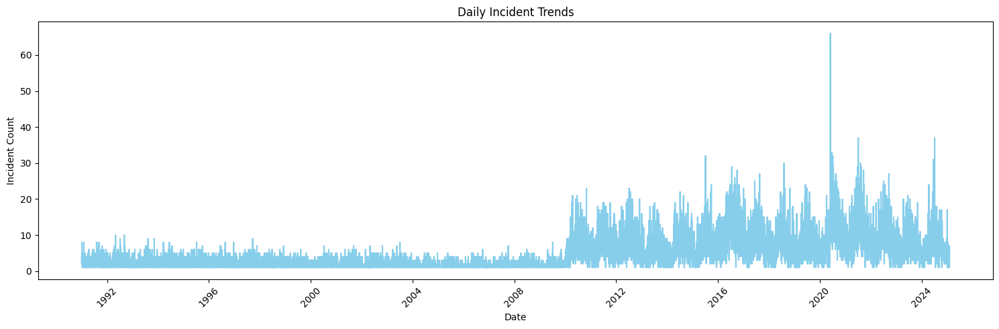

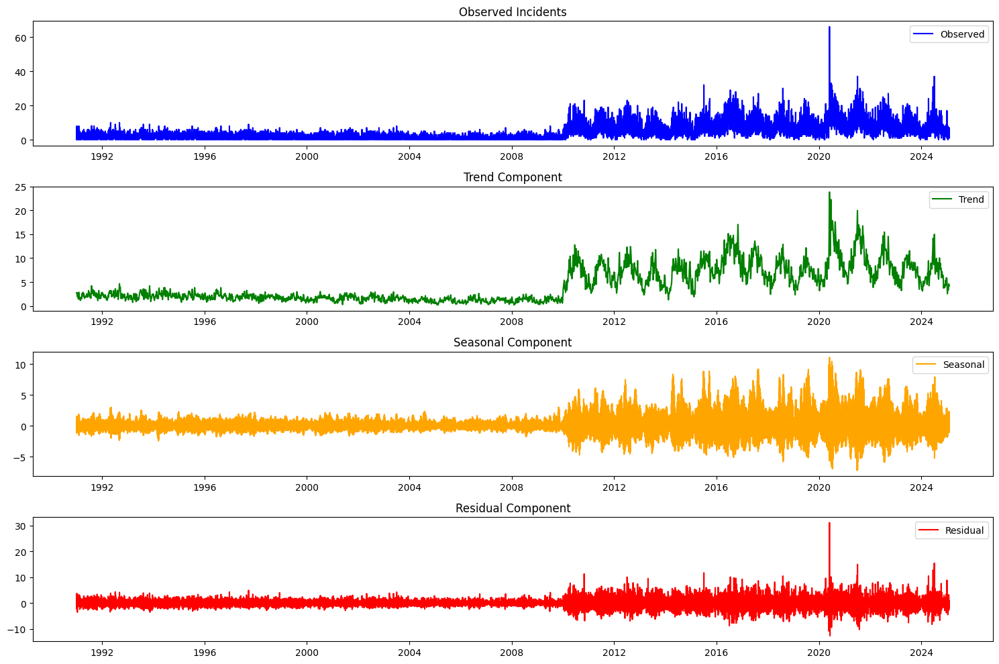

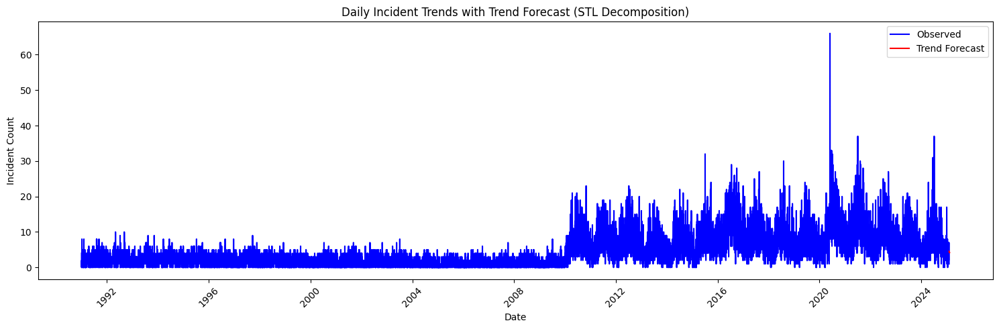

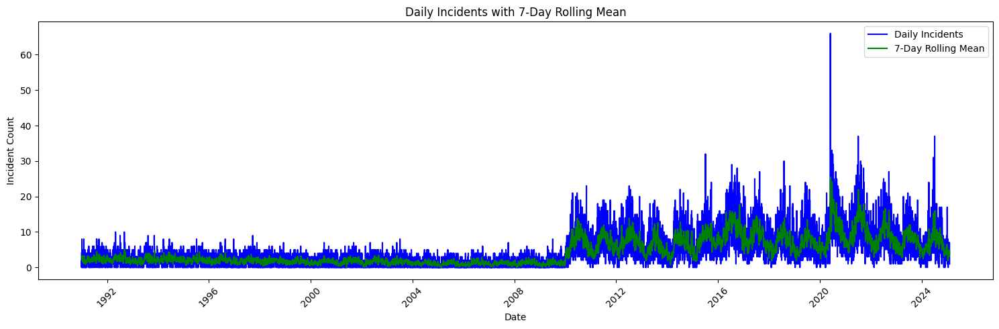


--- Step 4: Hourly Trends Visualization ---


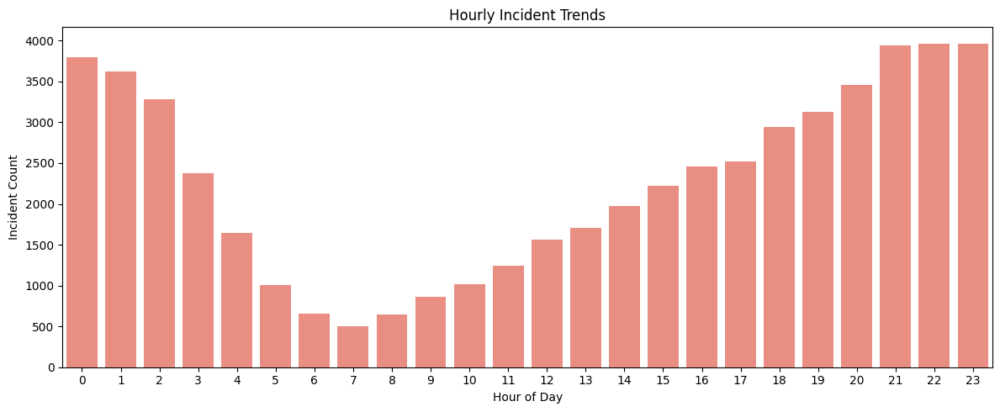


--- Step 5: Day of Week Trends Visualization ---


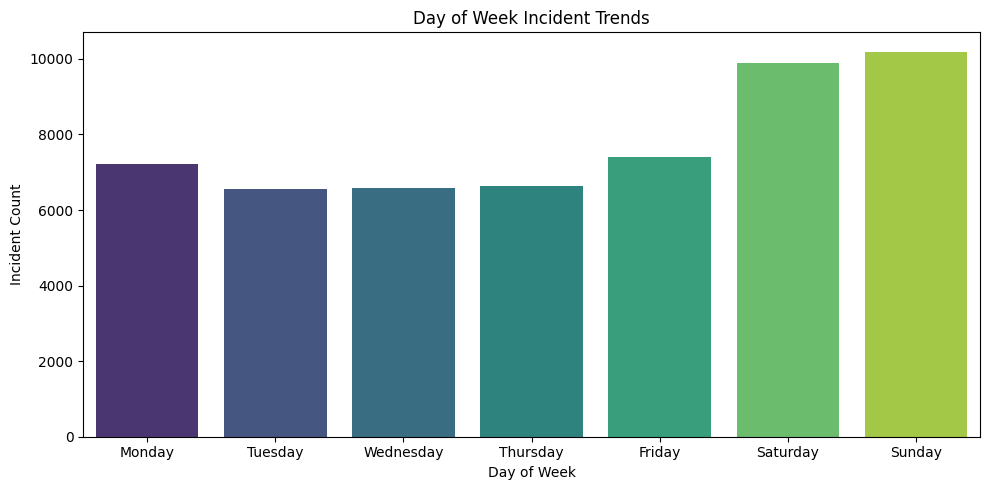


--- Step 6: Monthly Trends Visualization ---


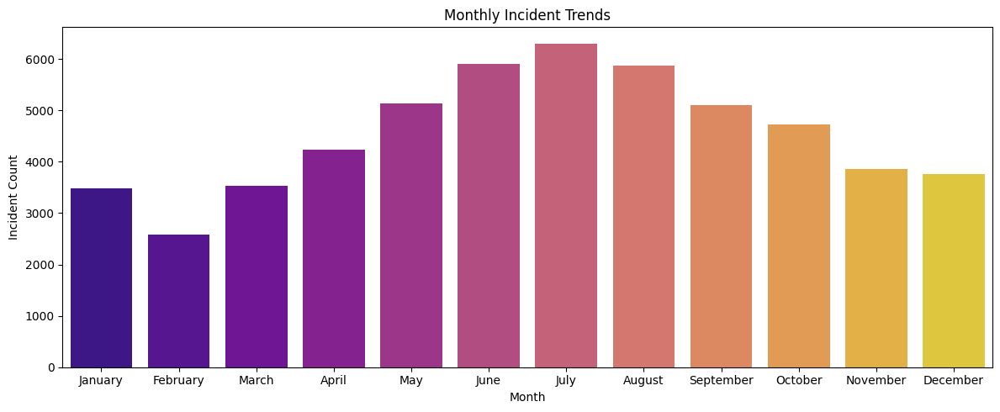


--- Step 7: Incident Trends by Sex ---


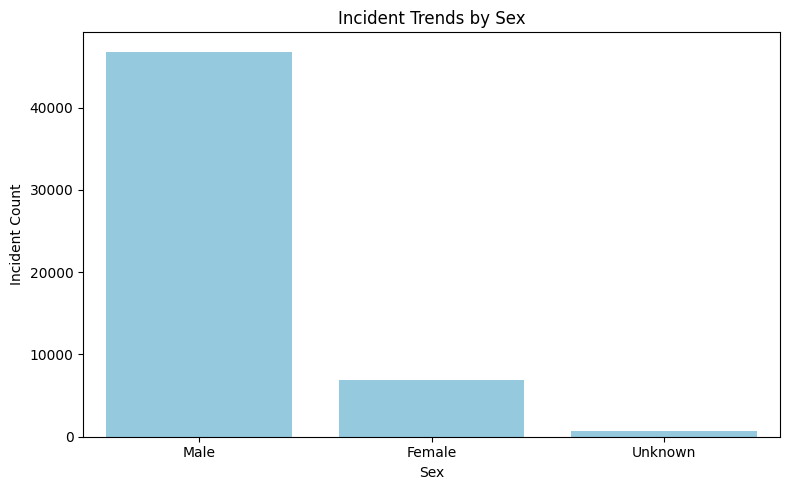


--- Step 8: Incident Trends by Race ---


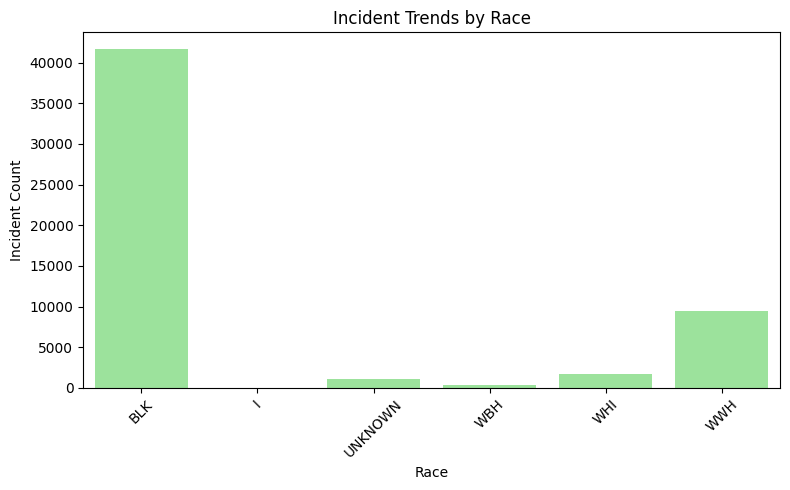


--- Step 9: Incident Trends by Location Group ---


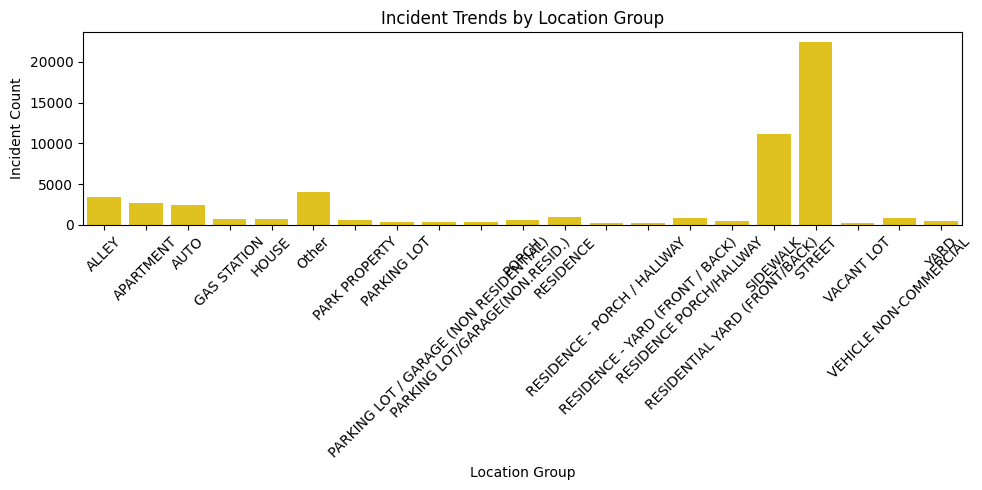


--- Step 10: Temporal Clustering (Hourly) ---


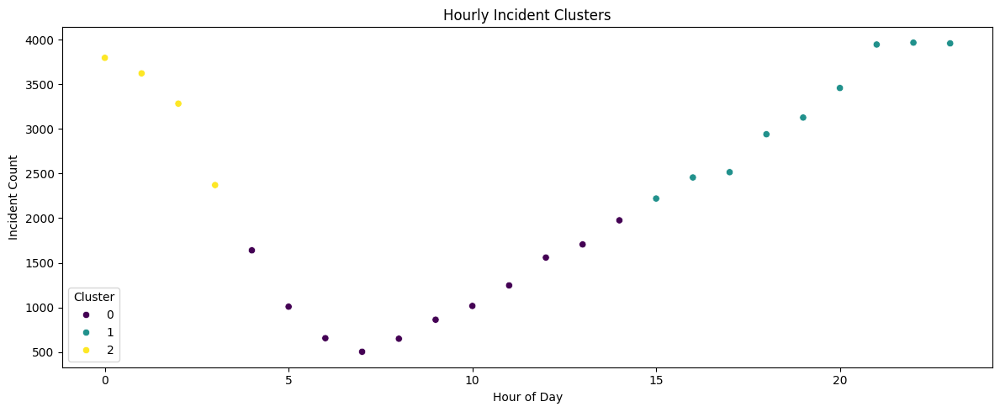


--- Step 11: Temporal Clustering (Day of Week) ---


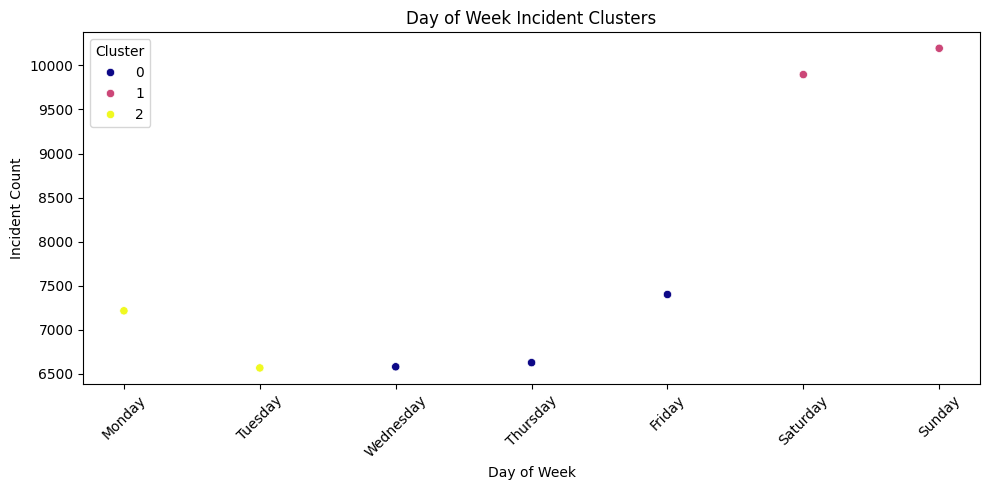


--- Step 12: Temporal Clustering (Monthly) ---


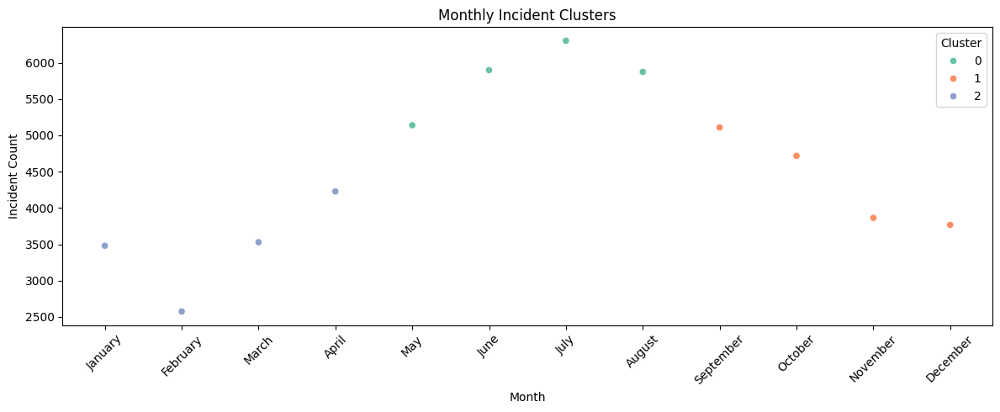

In [95]:
timestamp_col = 'date'
risk_level_col = 'RISK_LEVEL_Numeric'

temporal_trends(Violence_Reduction_df, timestamp_col, risk_level_col)

## 6. Conclusion :

### 1) Integrated Approach: 
     Combined spatial/temporal clustering, hotspots, and machine learning for comprehensive gun violence analysis.
### 2) Pattern Discovery: 
     Clustering revealed key spatial and temporal gun violence patterns.
### 3) Hotspot Identification:
     Hotspot analysis pinpointed specific high-risk areas.m
### 4) Effective Prediction:
     Machine learning model accurately classified gun violence risk levels.
### 5) Actionable Insights:
     Provides valuable insights for targeted interventions and resource allocation.